# Importing the modules

In [1]:
#Data Analysis
import pandas as pd
import numpy as np
#Data Visualization
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.offline as py
from plotly.offline import iplot, init_notebook_mode
import warnings
import pandas_profiling
warnings.filterwarnings("ignore")
import plotly.graph_objs as go
import math
import re
from wordcloud import WordCloud,STOPWORDS 
from IPython.display import display, HTML

# Loading the dataset



In [2]:
fifa = pd.read_csv("D:\\data.csv")
fifa.shape

(18207, 89)

# Dataset Description

In [3]:
fifa.head(50)

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M
5,5,183277,E. Hazard,27,https://cdn.sofifa.org/players/4/19/183277.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,91,Chelsea,...,91.0,34.0,27.0,22.0,11.0,12.0,6.0,8.0,8.0,€172.1M
6,6,177003,L. Modrić,32,https://cdn.sofifa.org/players/4/19/177003.png,Croatia,https://cdn.sofifa.org/flags/10.png,91,91,Real Madrid,...,84.0,60.0,76.0,73.0,13.0,9.0,7.0,14.0,9.0,€137.4M
7,7,176580,L. Suárez,31,https://cdn.sofifa.org/players/4/19/176580.png,Uruguay,https://cdn.sofifa.org/flags/60.png,91,91,FC Barcelona,...,85.0,62.0,45.0,38.0,27.0,25.0,31.0,33.0,37.0,€164M
8,8,155862,Sergio Ramos,32,https://cdn.sofifa.org/players/4/19/155862.png,Spain,https://cdn.sofifa.org/flags/45.png,91,91,Real Madrid,...,82.0,87.0,92.0,91.0,11.0,8.0,9.0,7.0,11.0,€104.6M
9,9,200389,J. Oblak,25,https://cdn.sofifa.org/players/4/19/200389.png,Slovenia,https://cdn.sofifa.org/flags/44.png,90,93,Atlético Madrid,...,70.0,27.0,12.0,18.0,86.0,92.0,78.0,88.0,89.0,€144.5M


In [4]:
fifa.tail()

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
18202,18202,238813,J. Lundstram,19,https://cdn.sofifa.org/players/4/19/238813.png,England,https://cdn.sofifa.org/flags/14.png,47,65,Crewe Alexandra,...,45.0,40.0,48.0,47.0,10.0,13.0,7.0,8.0,9.0,€143K
18203,18203,243165,N. Christoffersson,19,https://cdn.sofifa.org/players/4/19/243165.png,Sweden,https://cdn.sofifa.org/flags/46.png,47,63,Trelleborgs FF,...,42.0,22.0,15.0,19.0,10.0,9.0,9.0,5.0,12.0,€113K
18204,18204,241638,B. Worman,16,https://cdn.sofifa.org/players/4/19/241638.png,England,https://cdn.sofifa.org/flags/14.png,47,67,Cambridge United,...,41.0,32.0,13.0,11.0,6.0,5.0,10.0,6.0,13.0,€165K
18205,18205,246268,D. Walker-Rice,17,https://cdn.sofifa.org/players/4/19/246268.png,England,https://cdn.sofifa.org/flags/14.png,47,66,Tranmere Rovers,...,46.0,20.0,25.0,27.0,14.0,6.0,14.0,8.0,9.0,€143K
18206,18206,246269,G. Nugent,16,https://cdn.sofifa.org/players/4/19/246269.png,England,https://cdn.sofifa.org/flags/14.png,46,66,Tranmere Rovers,...,43.0,40.0,43.0,50.0,10.0,15.0,9.0,12.0,9.0,€165K


In [5]:
fifa.columns

Index(['Unnamed: 0', 'ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag',
       'Overall', 'Potential', 'Club', 'Club Logo', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Jersey Number', 'Joined', 'Loaned From', 'Contract Valid Until',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingT

In [6]:
fifa.drop(['Unnamed: 0'], axis = 1,inplace=True)


In [7]:
fifa.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,...,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
count,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18159.000000,18159.000000,18159.000000,18147.000000,18159.000000,...,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000
mean,214298.338606,25.122206,66.238699,71.307299,1597.809908,1.113222,2.947299,2.361308,19.546096,49.734181,...,48.548598,58.648274,47.281623,47.697836,45.661435,16.616223,16.391596,16.232061,16.388898,16.710887
std,29965.244204,4.669943,6.908930,6.136496,272.586016,0.394031,0.660456,0.756164,15.947765,18.364524,...,15.704053,11.436133,19.904397,21.664004,21.289135,17.695349,16.906900,16.502864,17.034669,17.955119
min,16.000000,16.000000,46.000000,48.000000,731.000000,1.000000,1.000000,1.000000,1.000000,5.000000,...,5.000000,3.000000,3.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,200315.500000,21.000000,62.000000,67.000000,1457.000000,1.000000,3.000000,2.000000,8.000000,38.000000,...,39.000000,51.000000,30.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,221759.000000,25.000000,66.000000,71.000000,1635.000000,1.000000,3.000000,2.000000,17.000000,54.000000,...,49.000000,60.000000,53.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,236529.500000,28.000000,71.000000,75.000000,1787.000000,1.000000,3.000000,3.000000,26.000000,64.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,246620.000000,45.000000,94.000000,95.000000,2346.000000,5.000000,5.000000,5.000000,99.000000,93.000000,...,92.000000,96.000000,94.000000,93.000000,91.000000,90.000000,92.000000,91.000000,90.000000,94.000000


In [8]:
fifa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 88 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        18207 non-null  int64  
 1   Name                      18207 non-null  object 
 2   Age                       18207 non-null  int64  
 3   Photo                     18207 non-null  object 
 4   Nationality               18207 non-null  object 
 5   Flag                      18207 non-null  object 
 6   Overall                   18207 non-null  int64  
 7   Potential                 18207 non-null  int64  
 8   Club                      17966 non-null  object 
 9   Club Logo                 18207 non-null  object 
 10  Value                     18207 non-null  object 
 11  Wage                      18207 non-null  object 
 12  Special                   18207 non-null  int64  
 13  Preferred Foot            18159 non-null  object 
 14  Intern

# Eliminating the columns from analysis

In [9]:
fifa.drop([ 'ID', 'Photo', 'Flag', 'Club Logo'], axis = 1, inplace=True)
fifa.head()



,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,Preferred Foot,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,L. Messi,31,Argentina,94,94,FC Barcelona,€110.5M,€565K,2202,Left,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,€77M,€405K,2228,Right,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,€118.5M,€290K,2143,Right,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,De Gea,27,Spain,91,93,Manchester United,€72M,€260K,1471,Right,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,K. De Bruyne,27,Belgium,91,92,Manchester City,€102M,€355K,2281,Right,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


In [11]:
fifa.isnull().sum()

Name                 0
Age                  0
Nationality          0
Overall              0
Potential            0
                  ... 
GKHandling          48
GKKicking           48
GKPositioning       48
GKReflexes          48
Release Clause    1564
Length: 84, dtype: int64

# Data cleaning

In [12]:
fifa['ShortPassing'].fillna(fifa['ShortPassing'].mean(), inplace = True)
fifa['Volleys'].fillna(fifa['Volleys'].mean(), inplace = True)
fifa['Dribbling'].fillna(fifa['Dribbling'].mean(), inplace = True)
fifa['Curve'].fillna(fifa['Curve'].mean(), inplace = True)
fifa['FKAccuracy'].fillna(fifa['FKAccuracy'], inplace = True)
fifa['LongPassing'].fillna(fifa['LongPassing'].mean(), inplace = True)
fifa['BallControl'].fillna(fifa['BallControl'].mean(), inplace = True)
fifa['HeadingAccuracy'].fillna(fifa['HeadingAccuracy'].mean(), inplace = True)
fifa['Finishing'].fillna(fifa['Finishing'].mean(), inplace = True)
fifa['Crossing'].fillna(fifa['Crossing'].mean(), inplace = True)
fifa['Weight'].fillna('200lbs', inplace = True)
fifa['Contract Valid Until'].fillna(2019, inplace = True)
fifa['Height'].fillna("5'11", inplace = True)
fifa['Loaned From'].fillna('None', inplace = True)
fifa['Joined'].fillna('Jul 1, 2018', inplace = True)
fifa['Jersey Number'].fillna(8, inplace = True)
fifa['Body Type'].fillna('Normal', inplace = True)
fifa['Position'].fillna('ST', inplace = True)
fifa['Club'].fillna('No Club', inplace = True)
fifa['Work Rate'].fillna('Medium/ Medium', inplace = True)
fifa['Skill Moves'].fillna(fifa['Skill Moves'].median(), inplace = True)
fifa['Weak Foot'].fillna(3, inplace = True)
fifa['Preferred Foot'].fillna('Right', inplace = True)
fifa['International Reputation'].fillna(1, inplace = True)
fifa['Wage'].fillna('€200K', inplace = True)
fifa['Composure'].fillna(fifa['Composure'].mean(), inplace = True)
fifa['Marking'].fillna(fifa['Marking'].mean(), inplace = True)
fifa['StandingTackle'].fillna(fifa['StandingTackle'].mean(), inplace = True)
fifa['SlidingTackle'].fillna(fifa['SlidingTackle'].mean(), inplace = True)
fifa['GKDiving'].fillna(fifa['GKDiving'].mean(), inplace = True)
fifa['GKHandling'].fillna(fifa['GKHandling'].mean(), inplace = True)
fifa['GKKicking'].fillna(fifa['GKKicking'].mean(), inplace = True)
fifa['GKPositioning'].fillna(fifa['GKPositioning'].mean(), inplace = True)
fifa['GKReflexes'].fillna(fifa['GKReflexes'].mean(), inplace = True)

In [13]:
fifa.fillna(0, inplace = True)

In [14]:
fifa[['Value', 'Wage', 'Release Clause']].isnull().sum()

Value             0
Wage              0
Release Clause    0
dtype: int64

In [15]:
replace = lambda x: re.sub("[€MK]","",x) # Wage and values in the columns are string like €10M,€1000K, use re

In [16]:
fifa['Wage'] = fifa['Wage'].apply(replace).astype("float")
fifa['Value'] = fifa['Value'].apply(replace).astype("float")

In [17]:
fifa.head()

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,Preferred Foot,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,L. Messi,31,Argentina,94,94,FC Barcelona,110.5,565.0,2202,Left,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,77.0,405.0,2228,Right,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,118.5,290.0,2143,Right,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,De Gea,27,Spain,91,93,Manchester United,72.0,260.0,1471,Right,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,K. De Bruyne,27,Belgium,91,92,Manchester City,102.0,355.0,2281,Right,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


# Data visualization

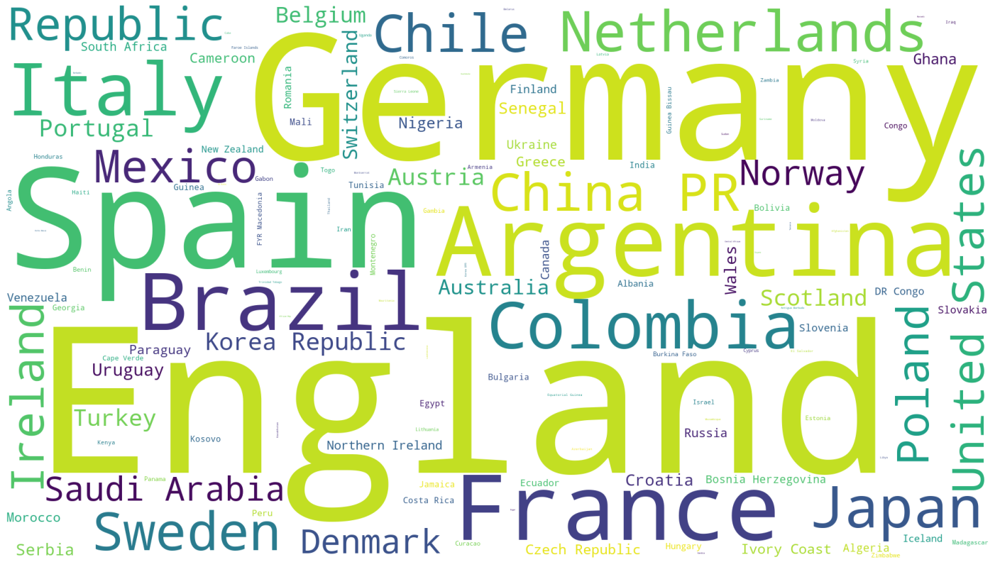

In [18]:
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='white',
                          width=1920,
                          height=1080
                         ).generate(" ".join(fifa.Nationality))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('graph.png')
plt.show()

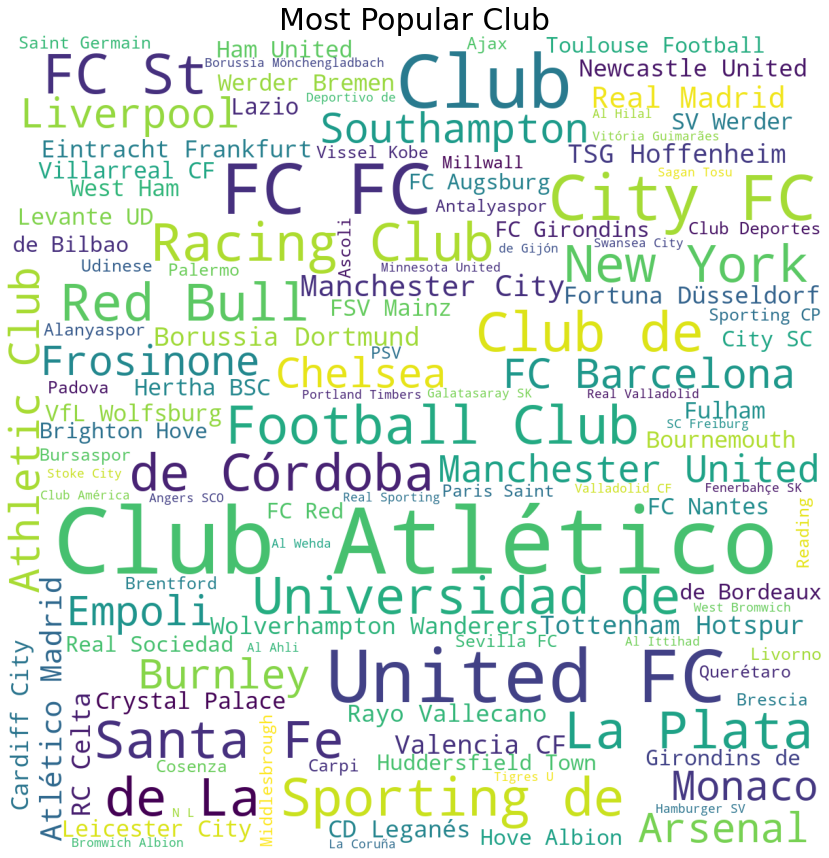

In [19]:
plt.rcParams['figure.figsize'] = (15, 15)
wordcloud = WordCloud(background_color = 'white', width = 1200,  height = 1200, max_words = 121).generate(' '.join(fifa['Club']))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Most Popular Club',fontsize = 30)
plt.show()

In [20]:
fifa['Preferred Foot'].value_counts()

Right    13996
Left      4211
Name: Preferred Foot, dtype: int64

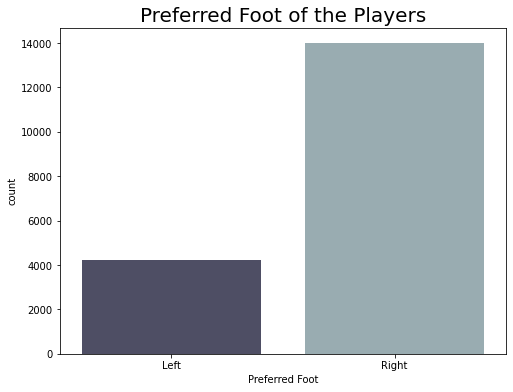

In [21]:
plt.figure(figsize=(8,6))
sns.countplot(fifa['Preferred Foot'], palette = 'bone')
plt.title('Preferred Foot of the Players', fontsize = 20)
plt.show()

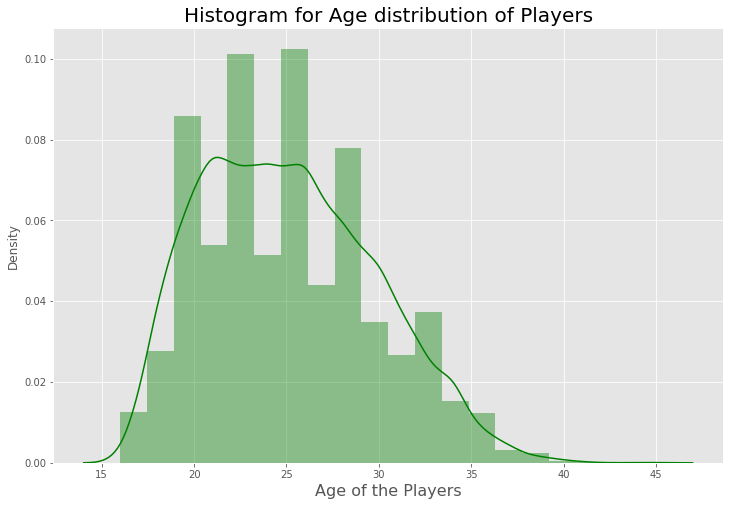

In [24]:
h= fifa['Age']
plt.figure(figsize = (12, 8))
plt.style.use('ggplot')
ax = sns.distplot(x, bins = 20, kde = True, color='g')
ax.set_xlabel(xlabel = 'Age of the Players', fontsize = 16)
ax.set_title(label = 'Histogram for Age distribution of Players', fontsize = 20)
plt.show()

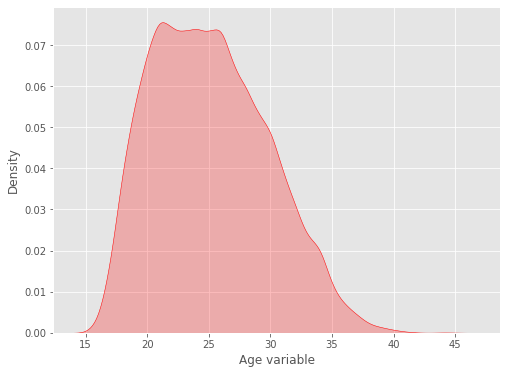

In [23]:
# kernel density estimate (KDE)
f, ax = plt.subplots(figsize=(8,6))
x = fifa['Age']
x = pd.Series(x, name="Age variable")
ax = sns.kdeplot(x, shade=True, color='r')
plt.show()

In [25]:
fifa['International Reputation'].value_counts()


1.0    16580
2.0     1261
3.0      309
4.0       51
5.0        6
Name: International Reputation, dtype: int64

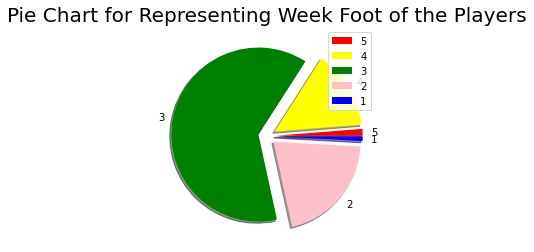

In [16]:
labels = ['5', '4', '3', '2', '1'] 
size = [229, 2662, 11349, 3761, 158]
colors = ['red', 'yellow', 'green', 'pink', 'blue']
explode = [0.1, 0.1, 0.1, 0.1, 0.1]

plt.pie(size, labels = labels, colors = colors, explode = explode, shadow = True)
plt.title('Pie Chart for Representing Week Foot of the Players', fontsize = 20)
plt.legend()
plt.show()

In [27]:
fifa.groupby('Preferred Foot')['International Reputation'].value_counts()


Preferred Foot  International Reputation
Left            1.0                          3839
                2.0                           290
                3.0                            66
                4.0                            15
                5.0                             1
Right           1.0                         12741
                2.0                           971
                3.0                           243
                4.0                            36
                5.0                             5
Name: International Reputation, dtype: int64

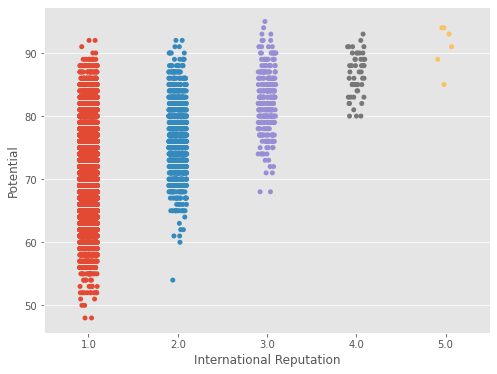

In [28]:
 #using Stripplot function ()
f, ax = plt.subplots(figsize=(8, 6))
sns.stripplot(x="International Reputation", y="Potential", data=fifa)
plt.show()

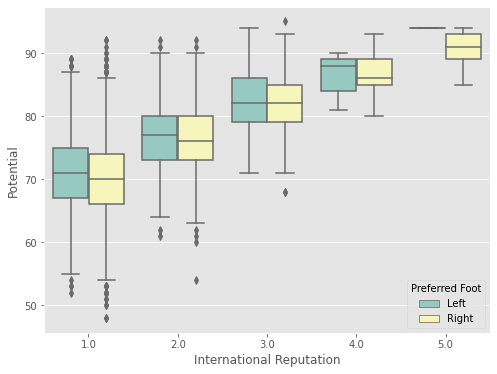

In [29]:
f, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(x="International Reputation", y="Potential", hue="Preferred Foot", data=fifa, palette="Set3")
plt.show()

In [30]:
fifa['Work Rate'].value_counts()

Medium/ Medium    9858
High/ Medium      3173
Medium/ High      1690
High/ High        1015
Medium/ Low        850
High/ Low          699
Low/ Medium        449
Low/ High          439
Low/ Low            34
Name: Work Rate, dtype: int64

In [31]:
missing_height = fifa[fifa['Height'].isnull()].index.tolist()
missing_weight = fifa[fifa['Weight'].isnull()].index.tolist()
if missing_height == missing_weight:
    print('They are same')
else:
    print('They are different')

They are same


In [32]:
fifa.drop(fifa.index[missing_height],inplace =True)

In [33]:
print('Total number of countries : {0}'.format(fifa['Nationality'].nunique()))
print(fifa['Nationality'].value_counts().head(10))
print('--'*40)
print("\nEuropean Countries have most players")

Total number of countries : 164
England        1662
Germany        1198
Spain          1072
Argentina       937
France          914
Brazil          827
Italy           702
Colombia        618
Japan           478
Netherlands     453
Name: Nationality, dtype: int64
--------------------------------------------------------------------------------

European Countries have most players


In [5]:
print('Maximum Potential : '+str(fifa.loc[fifa['Potential'].idxmax()][2]))
print('Maximum Overall Perforamnce : '+str(fifa.loc[fifa['Overall'].idxmax()][2]))

Maximum Potential : K. Mbappé
Maximum Overall Perforamnce : L. Messi


In [34]:
#Total number of clubs present and top 5 clubs with highest number of players
print('Total number of clubs : {0}'.format(fifa['Club'].nunique()))
print(fifa['Club'].value_counts().head(5))

Total number of clubs : 652
No Club                241
Frosinone               33
Empoli                  33
Liverpool               33
TSG 1899 Hoffenheim     33
Name: Club, dtype: int64


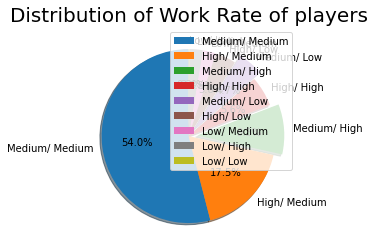

In [5]:
labels = fifa['Work Rate'].value_counts().index
size = fifa['Work Rate'].value_counts()
explode = [0,0,0.1,0,0.1,0,0,0,0]
plt.pie(size, labels = labels, explode = explode, shadow = True, autopct='%1.1f%%',startangle = 90)
plt.title('Distribution of Work Rate of players', fontsize = 20)
plt.legend()
plt.show()

In [18]:
trace = go.Violin(x=fifa['Work Rate'],
                y=fifa['Overall']
               )

layout = go.Layout(title='<b>Work Rate vs Overall</b>',
                   xaxis=dict(title='<b><i>Work Rate</b></i>'),
                   yaxis=dict(title='<b><i>Overall</b></i>')
                  )

fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig)



In [19]:
import plotly.figure_factory as ff

#prepare data frame
fifaV=fifa.loc[:2500]
fifaV1 = fifaV.loc[:,["Overall","Age","Value"]]
fifaV1["index"]=np.arange(1,len(fifaV1)+1)

#scatter matrix
fig=ff.create_scatterplotmatrix(fifaV1, diag="box", index="index", colormap='Portland',
                                colormap_type='cat',
                                height=700,width=700)

iplot(fig)

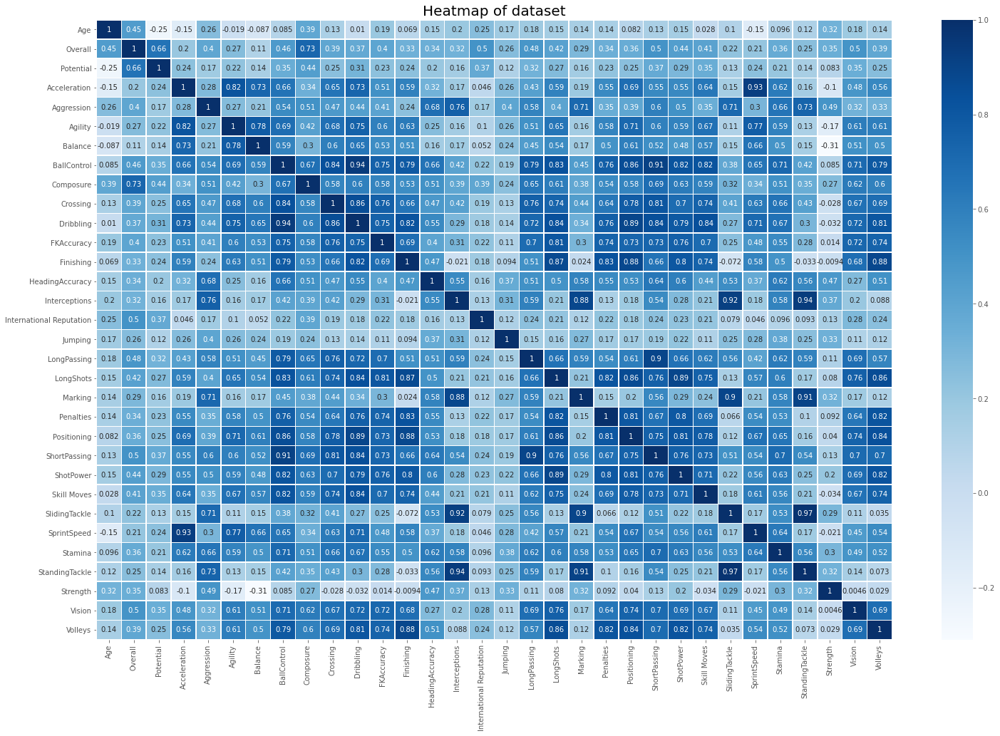

In [36]:
plt.rcParams['figure.figsize']=(25,16)
hm=sns.heatmap(fifa[['Age', 'Overall', 'Potential', 'Value', 'Wage',
                'Acceleration', 'Aggression', 'Agility', 'Balance', 'BallControl', 
                'Body Type','Composure', 'Crossing','Dribbling', 'FKAccuracy', 'Finishing', 
                'HeadingAccuracy', 'Interceptions','International Reputation',
                'Joined', 'Jumping', 'LongPassing', 'LongShots',
                'Marking', 'Penalties', 'Position', 'Positioning',
                'ShortPassing', 'ShotPower', 'Skill Moves', 'SlidingTackle',
                'SprintSpeed', 'Stamina', 'StandingTackle', 'Strength', 'Vision',
                'Volleys']].corr(), annot = True, linewidths=.5, cmap='Blues')
hm.set_title(label='Heatmap of dataset', fontsize=20)
hm;

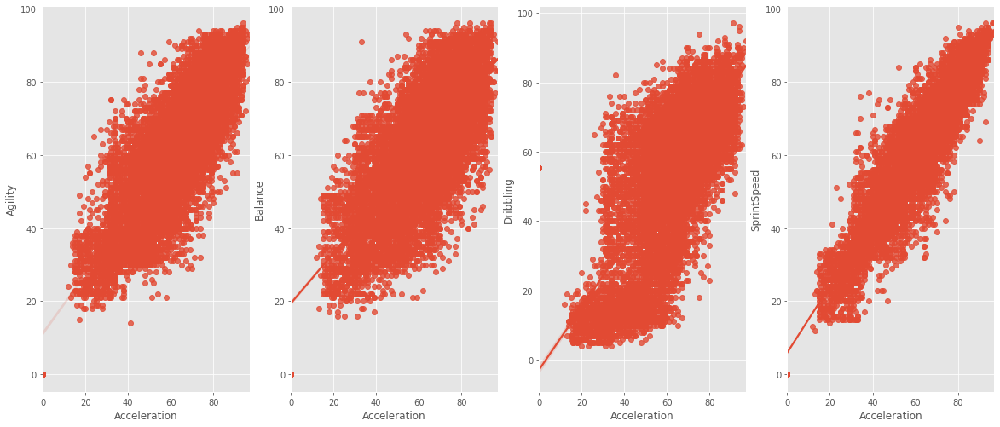

In [37]:
def make_scatter(df):
    feats = ('Agility', 'Balance', 'Dribbling', 'SprintSpeed')
    
    for index, feat in enumerate(feats):
        plt.subplot(len(feats)/4+1, 4, index+1)
        ax = sns.regplot(x = 'Acceleration', y = feat, data = df)

plt.figure(figsize = (20, 20))
plt.subplots_adjust(hspace = 0.4)

make_scatter(fifa)

# EDA

In [38]:
# The five eldest players
eldest = fifa.sort_values('Age', ascending = False)[['Name', 'Nationality', 'Age']].head(5)
eldest.set_index('Name', inplace=True)
print(eldest)

                     Nationality  Age
Name                                 
O. Pérez                  Mexico   45
K. Pilkington            England   44
T. Warner      Trinidad & Tobago   44
S. Narazaki                Japan   42
C. Muñoz               Argentina   41


In [39]:
# The five youngest players
eldest = fifa.sort_values('Age', ascending = True)[['Name', 'Nationality', 'Age']].head(5)
eldest.set_index('Name', inplace=True)
print(eldest)

            Nationality  Age
Name                        
G. Nugent       England   16
J. Olstad        Norway   16
H. Massengo      France   16
J. Italiano   Australia   16
N. Ayéva         Sweden   16


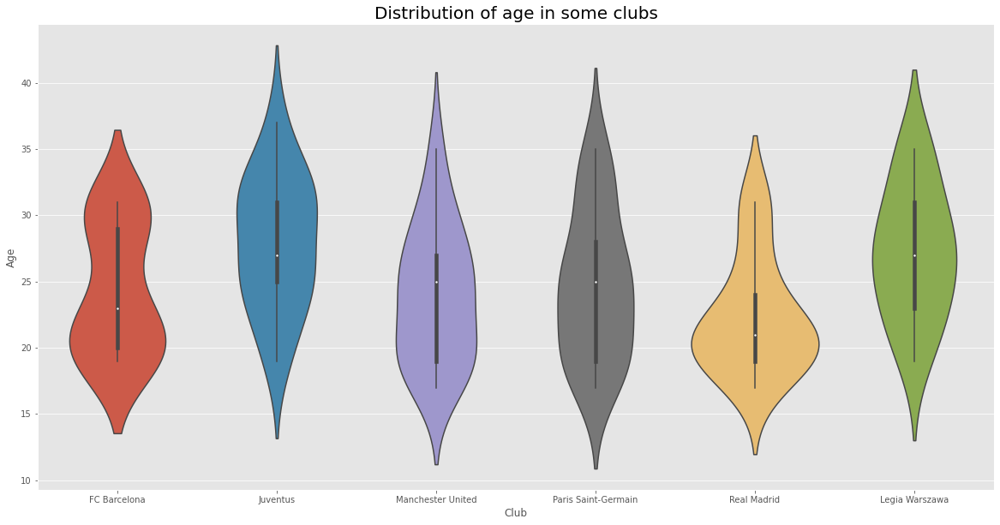

In [41]:
some_clubs = ('Juventus', 'Real Madrid', 'Paris Saint-Germain', 'FC Barcelona', 'Legia Warszawa', 'Manchester United')
fifa_club = fifa.loc[fifa['Club'].isin(some_clubs) & fifa['Age']]

fig, ax = plt.subplots()
fig.set_size_inches(20, 10)
ax = sns.violinplot(x="Club", y="Age", data=fifa_club);
ax.set_title(label='Distribution of age in some clubs', fontsize=20);

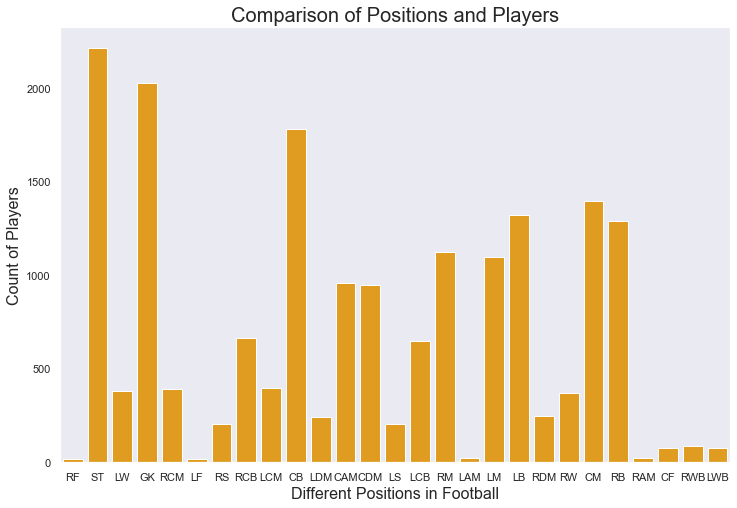

In [40]:
plt.figure(figsize = (12, 8))
sns.set(style = 'dark', palette = 'colorblind', color_codes = True)
ax = sns.countplot('Position', data = fifa, color = 'orange')
ax.set_xlabel(xlabel = 'Different Positions in Football', fontsize = 16)
ax.set_ylabel(ylabel = 'Count of Players', fontsize = 16)
ax.set_title(label = 'Comparison of Positions and Players', fontsize = 20)
plt.show()

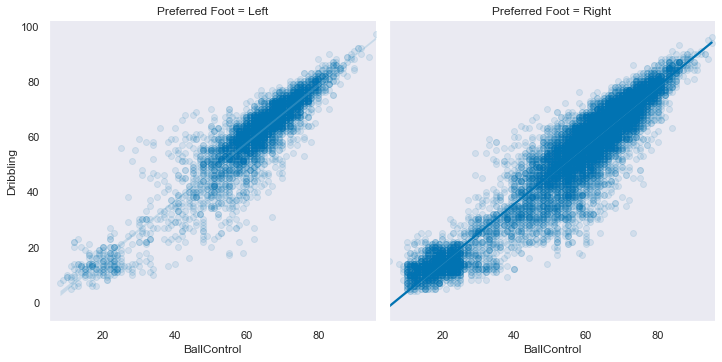

In [41]:
# Better is left-footed or rigth-footed players?
sns.lmplot(x = 'BallControl', y = 'Dribbling', data = fifa,
          scatter_kws = {'alpha':0.1},
          col = 'Preferred Foot');

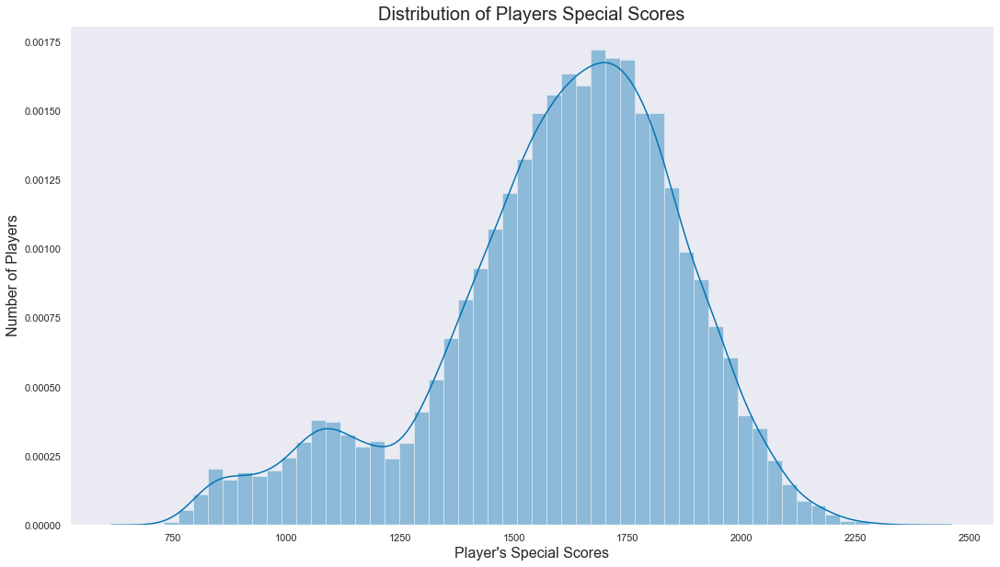

In [42]:
play = fifa['Special']
plt.figure(figsize=(18,10))
ax = sns.distplot(play)
ax.set_xlabel(xlabel = "Player's Special Scores", fontsize = 16)
ax.set_ylabel(ylabel = 'Number of Players', fontsize = 16)
ax.set_title(label = 'Distribution of Players Special Scores', fontsize = 20)
plt.show()


In [43]:
fifa['Position'].value_counts()

ST     2212
GK     2025
CB     1778
CM     1394
LB     1322
RB     1291
RM     1124
LM     1095
CAM     958
CDM     948
RCB     662
LCB     648
LCM     395
RCM     391
LW      381
RW      370
RDM     248
LDM     243
LS      207
RS      203
RWB      87
LWB      78
CF       74
RAM      21
LAM      21
RF       16
LF       15
Name: Position, dtype: int64

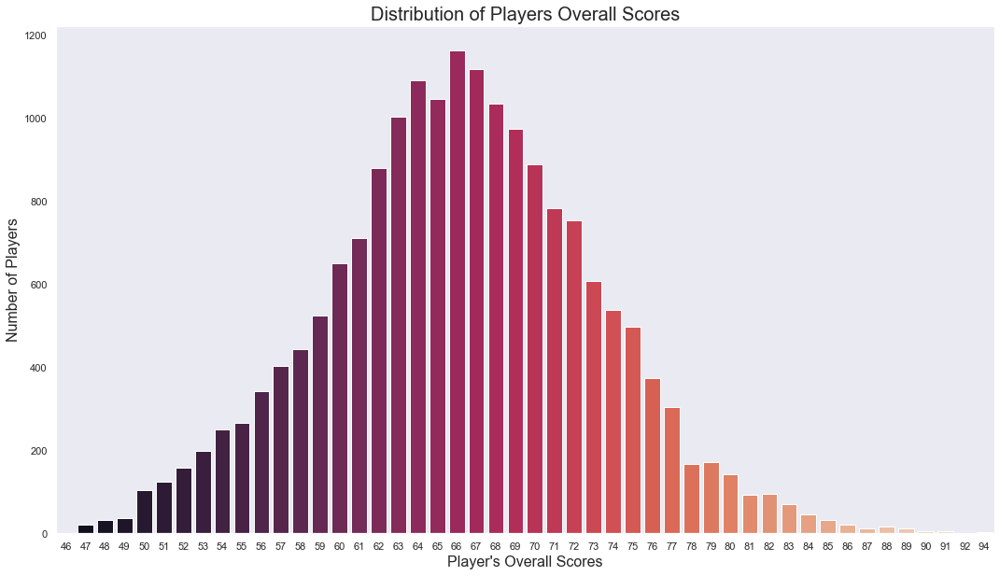

In [46]:
play= fifa['Overall']
plt.figure(figsize=(18,10))
ax = sns.countplot(play, palette='rocket')
ax.set_xlabel(xlabel = "Player's Overall Scores", fontsize = 16)
ax.set_ylabel(ylabel = 'Number of Players', fontsize = 16)
ax.set_title(label = 'Distribution of Players Overall Scores', fontsize = 20)
plt.show()

In [44]:
fifa['Nationality'].nunique()

164

In [45]:
fifa[['Name','Joined','Contract Valid Until']].head()

,Name,Joined,Contract Valid Until
0,L. Messi,"Jul 1, 2004",2021
1,Cristiano Ronaldo,"Jul 10, 2018",2022
2,Neymar Jr,"Aug 3, 2017",2022
3,De Gea,"Jul 1, 2011",2020
4,K. De Bruyne,"Aug 30, 2015",2023


In [46]:
fifa['Nationality'].unique()

array(['Argentina', 'Portugal', 'Brazil', 'Spain', 'Belgium', 'Croatia',
       'Uruguay', 'Slovenia', 'Poland', 'Germany', 'France', 'England',
       'Italy', 'Egypt', 'Colombia', 'Denmark', 'Gabon', 'Wales',
       'Senegal', 'Costa Rica', 'Slovakia', 'Netherlands',
       'Bosnia Herzegovina', 'Morocco', 'Serbia', 'Algeria', 'Austria',
       'Greece', 'Chile', 'Sweden', 'Korea Republic', 'Finland', 'Guinea',
       'Montenegro', 'Armenia', 'Switzerland', 'Norway', 'Czech Republic',
       'Scotland', 'Ghana', 'Central African Rep.', 'DR Congo',
       'Ivory Coast', 'Russia', 'Ukraine', 'Iceland', 'Mexico', 'Jamaica',
       'Albania', 'Venezuela', 'Japan', 'Turkey', 'Ecuador', 'Paraguay',
       'Mali', 'Nigeria', 'Cameroon', 'Dominican Republic', 'Israel',
       'Kenya', 'Hungary', 'Republic of Ireland', 'Romania',
       'United States', 'Cape Verde', 'Australia', 'Peru', 'Togo',
       'Syria', 'Zimbabwe', 'Angola', 'Burkina Faso', 'Iran', 'Estonia',
       'Tunisia', 'Equato

In [47]:
top_countries = fifa['Nationality'].value_counts().head(10)

top_countries

England        1662
Germany        1198
Spain          1072
Argentina       937
France          914
Brazil          827
Italy           702
Colombia        618
Japan           478
Netherlands     453
Name: Nationality, dtype: int64

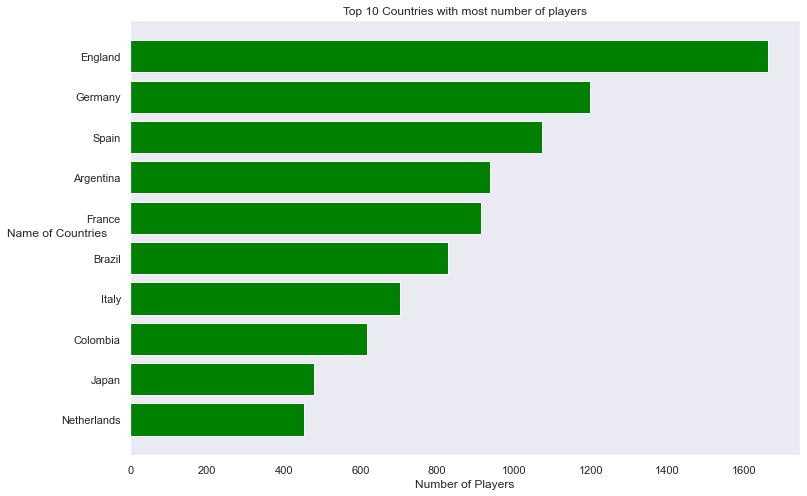

In [50]:
fig, ax = plt.subplots(figsize=(12,8))
x = top_countries.values
y = top_countries.index
ax.barh(y, x, align='center', color='green')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Number of Players')
ax.set_ylabel('Name of Countries', rotation=0)
ax.set_title('Top 10 Countries with most number of players')
plt.show()

In [51]:
# best players per each position with their age, club, and nationality based on their overall scores
fifa.iloc[fifa.groupby(fifa['Position'])['Overall'].idxmax()][['Position', 'Name', 'Age', 'Club', 'Nationality']]

,Position,Name,Age,Club,Nationality
17,CAM,A. Griezmann,27,Atlético Madrid,France
12,CB,D. Godín,32,Atlético Madrid,Uruguay
20,CDM,Sergio Busquets,29,FC Barcelona,Spain
271,CF,Luis Alberto,25,Lazio,Spain
67,CM,Thiago,27,FC Bayern München,Spain
3,GK,De Gea,27,Manchester United,Spain
28,LAM,J. Rodríguez,26,FC Bayern München,Colombia
35,LB,Marcelo,30,Real Madrid,Brazil
24,LCB,G. Chiellini,33,Juventus,Italy
11,LCM,T. Kroos,28,Real Madrid,Germany


In [52]:
# best players from each positions with their age, nationality, club based on their potential scores

fifa.iloc[fifa.groupby(fifa['Position'])['Potential'].idxmax()][['Position', 'Name', 'Age', 'Club', 'Nationality']]

,Position,Name,Age,Club,Nationality
31,CAM,C. Eriksen,26,Tottenham Hotspur,Denmark
42,CB,S. Umtiti,24,FC Barcelona,France
27,CDM,Casemiro,26,Real Madrid,Brazil
350,CF,A. Milik,24,Napoli,Poland
78,CM,S. Milinković-Savić,23,Lazio,Serbia
3,GK,De Gea,27,Manchester United,Spain
28,LAM,J. Rodríguez,26,FC Bayern München,Colombia
35,LB,Marcelo,30,Real Madrid,Brazil
77,LCB,M. Škriniar,23,Inter,Slovakia
11,LCM,T. Kroos,28,Real Madrid,Germany


In [4]:
fifa.groupby(['Club'])['Age'].sum().sort_values(ascending = False).head(5)

Club
Cardiff City     863
Villarreal CF    851
Burnley          850
Frosinone        843
Chelsea          832
Name: Age, dtype: int64

In [54]:
fifa.groupby(['Club'])['Age'].sum().sort_values(ascending = True).head(5)


Club
Derry City      398
Sligo Rovers    421
Limerick FC     436
Tromsø IL       476
FK Haugesund    508
Name: Age, dtype: int64

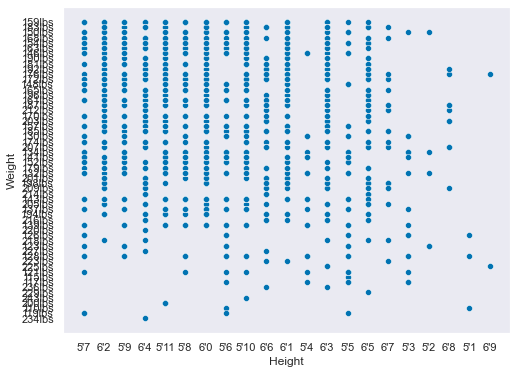

In [48]:
f, ax = plt.subplots(figsize=(8, 6))
sns.scatterplot(x="Height", y="Weight", data=fifa)
plt.show()

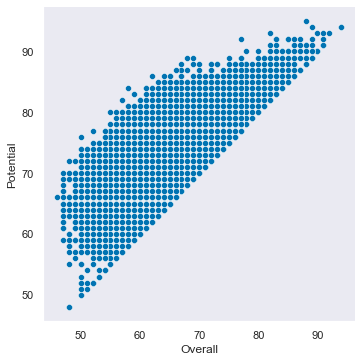

In [49]:
d = sns.relplot(x="Overall", y="Potential", data=fifa)

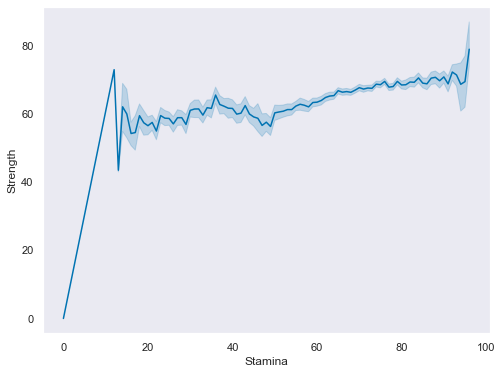

In [50]:
f, ax = plt.subplots(figsize=(8, 6))
ax = sns.lineplot(x="Stamina", y="Strength", data=fifa)
plt.show()

In [51]:
fifa_new = fifa[['Age', 'Potential', 'Strength', 'Stamina', 'Preferred Foot']]

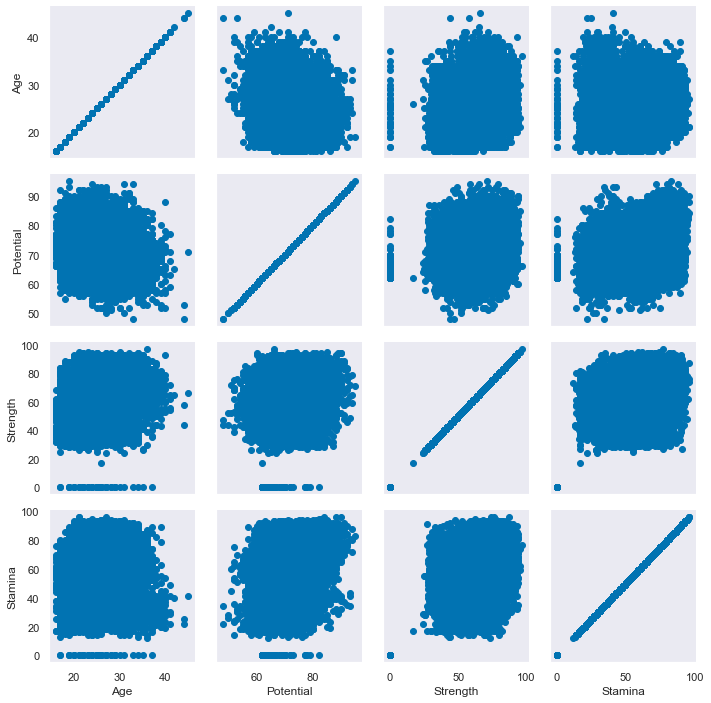

In [52]:
d = sns.PairGrid(fifa_new)
d = d.map(plt.scatter)

In [20]:
fifaV=fifa.loc[:250]

trace1=go.Scatter3d(
    x=fifaV.Overall,
    y=fifaV.BallControl,
    z=fifaV.ShotPower,
    mode='markers',
    marker=dict(
        size=fifaV.Age,
        color=fifaV.Value,
        colorscale='inferno',
        showscale=True
        
    )
)

fifaV1=[trace1]

layout=go.Layout(
    margin=dict(l=0,r=0,b=0,t=0),
    
    scene = dict(
    xaxis = dict(
        title='Overall'),
    yaxis = dict(
        title='Ball Control'),
    zaxis = dict(
        title='Shot Power'),),


)

fig=go.Figure(data=fifaV1, layout=layout)
iplot(fig)

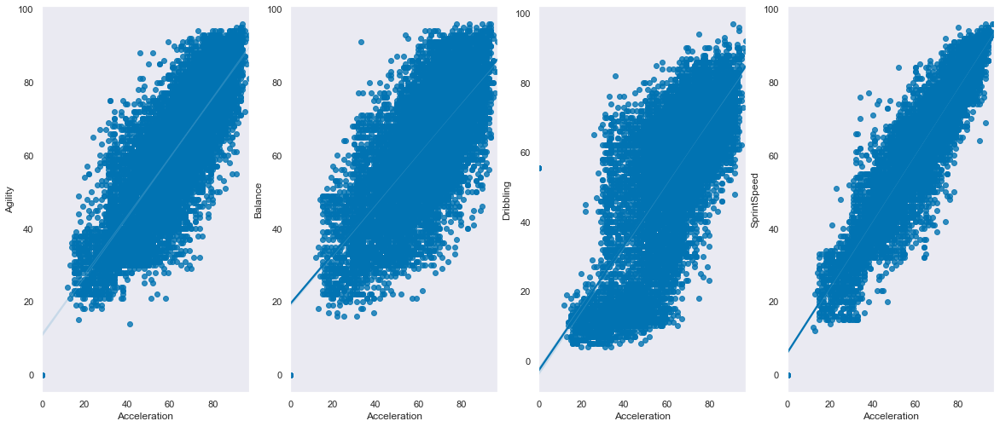

In [53]:
# Scater plot shows correlation between Acceleration and other chosen features
def make_scatter(fifa):
    feats = ('Agility', 'Balance', 'Dribbling', 'SprintSpeed')
    
    for index, feat in enumerate(feats):
        plt.subplot(len(feats)/4+1, 4, index+1)
        ax = sns.regplot(x = 'Acceleration', y = feat, data = fifa)

plt.figure(figsize = (20, 20))
plt.subplots_adjust(hspace = 0.4)

make_scatter(fifa)

In [13]:
fifa.head()

,Unnamed: 0,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,L. Messi,31,Argentina,94,94,FC Barcelona,110.5,565.0,2202,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,77.0,405.0,2228,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,118.5,290.0,2143,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,De Gea,27,Spain,91,93,Manchester United,72.0,260.0,1471,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,K. De Bruyne,27,Belgium,91,92,Manchester City,102.0,355.0,2281,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


In [14]:
fifa["Wage"].head()

0    565.0
1    405.0
2    290.0
3    260.0
4    355.0
Name: Wage, dtype: float64

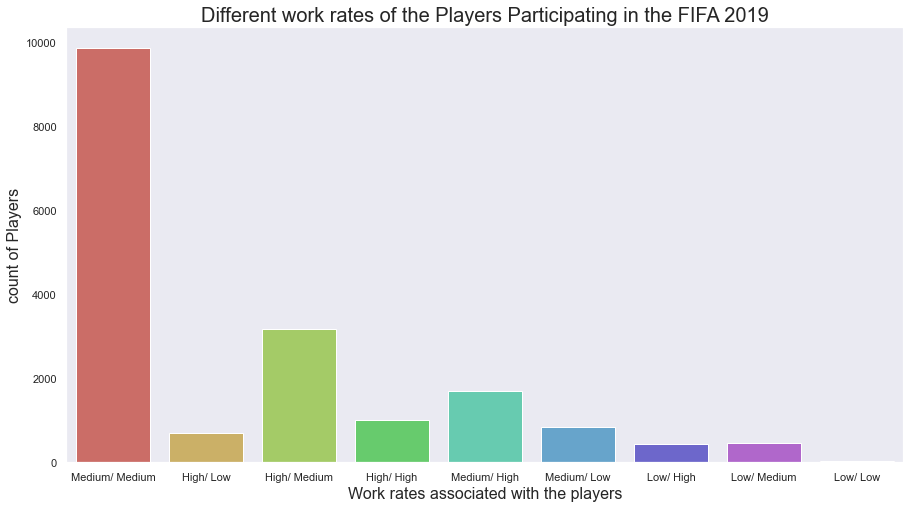

In [65]:
plt.figure(figsize = (15, 8))
sns.countplot(x = 'Work Rate', data = fifa, palette = 'hls')
plt.title('Different work rates of the Players Participating in the FIFA 2019', fontsize = 20)
plt.xlabel('Work rates associated with the players', fontsize = 16)
plt.ylabel('count of Players', fontsize = 16)
plt.show()

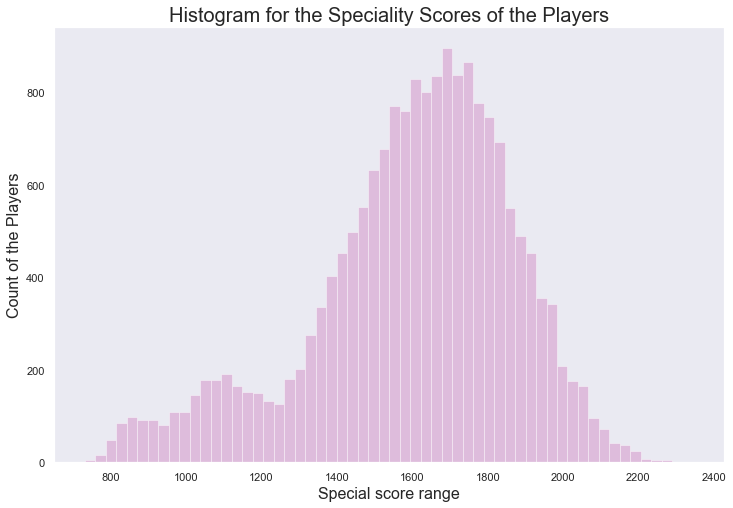

In [66]:
sns.set(style = 'dark', palette = 'colorblind', color_codes = True)
x = fifa.Special
plt.figure(figsize = (12, 8))
ax = sns.distplot(x, bins = 58, kde = False, color = 'm')
ax.set_xlabel(xlabel = 'Special score range', fontsize = 16)
ax.set_ylabel(ylabel = 'Count of the Players',fontsize = 16)
ax.set_title(label = 'Histogram for the Speciality Scores of the Players', fontsize = 20)
plt.show()

In [67]:
# filling the missing value for the continous variables for proper data visualization

fifa['Body Type'].fillna('Normal', inplace = True)

# replacing the single body types with the stocky body types

fifa['Body Type'].replace('Messi', 'Stocky', inplace = True)
fifa['Body Type'].replace('C. Ronaldo', 'Stocky', inplace = True)
fifa['Body Type'].replace('Courtois', 'Stocky', inplace = True)
fifa['Body Type'].replace('PLAYER_BODY_TYPE_25', 'Stocky', inplace = True)
fifa['Body Type'].replace('Shaqiri', 'Stocky', inplace = True)
fifa['Body Type'].replace('Neymar', 'Stocky', inplace = True)
fifa['Body Type'].replace('Akinfenwa', 'Stocky',inplace = True)

fifa['Body Type'].value_counts(dropna = False)

Normal    10643
Lean       6417
Stocky     1147
Name: Body Type, dtype: int64

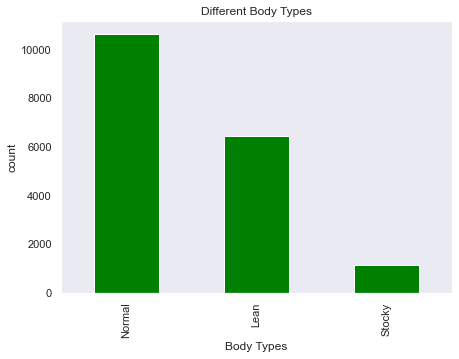

In [68]:
fifa['Body Type'].value_counts().plot.bar(color = 'green', figsize = (7, 5))
plt.title('Different Body Types')
plt.xlabel('Body Types')
plt.ylabel('count')
plt.show()

In [69]:
fifa[fifa['Preferred Foot'] == 'Left'][['Name','Overall']].head()

,Name,Overall
0,L. Messi,94
13,David Silva,90
15,P. Dybala,89
17,A. Griezmann,89
19,T. Courtois,89


In [21]:

labels = ['L.Messi','David Silva','P.Dybala','T.Courtois', 'A.Griezman']
values = [94, 90, 89, 89, 89]

fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.show()

In [71]:
fifa[fifa['Preferred Foot'] == 'Right'][['Name','Overall']].head()

,Name,Overall
1,Cristiano Ronaldo,94
2,Neymar Jr,92
3,De Gea,91
4,K. De Bruyne,91
5,E. Hazard,91


In [22]:
labels = ['Cristiano Ronaldo','Neymar Jr','De Gea','K De Bruyne', 'E.Hazard']
values = [94, 92, 91, 91, 91]

fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.show()

In [73]:
fifa.Penalties.value_counts()

45.0    492
55.0    488
49.0    480
48.0    473
58.0    471
       ... 
87.0      3
7.0       1
92.0      1
91.0      1
5.0       1
Name: Penalties, Length: 87, dtype: int64

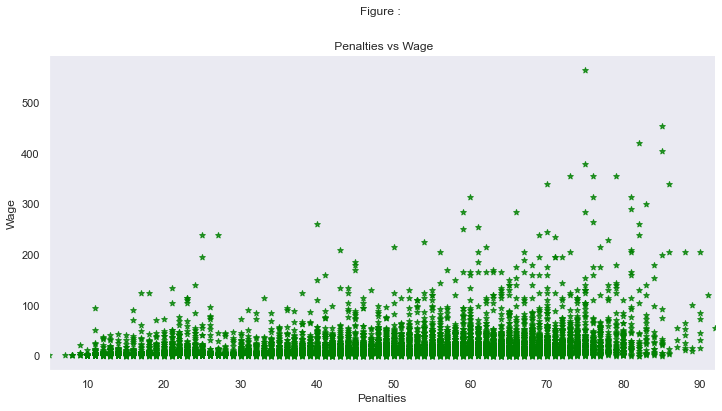

In [74]:
sns.lmplot(x="Penalties", y="Wage",data=fifa,markers="*",
           order=1, ci=None, scatter_kws={"color": "green"},
         line_kws={"linewidth":3,"color":"red"},aspect=2);
plt.title("Figure : \n\n\n Penalties vs Wage");
plt.show()

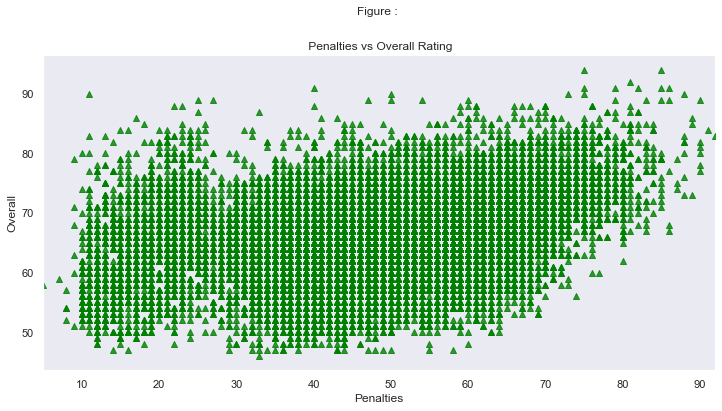

In [75]:
sns.lmplot(x="Penalties", y="Overall",data=fifa,markers="^",
           order=1, ci=None, scatter_kws={"color": "green"},
         line_kws={"linewidth":3,"color":"red"},aspect=2);
plt.title("Figure : \n\n\n Penalties vs Overall Rating");

In [76]:
fifa.Height.value_counts()

6'0     2881
5'10    2479
5'9     2238
5'11    2207
6'2     2015
6'1     1908
6'3      990
5'8      946
5'7      905
6'4      749
5'6      316
6'5      246
5'5      145
6'6       93
5'4       30
6'7       21
5'3       18
6'8       10
5'2        5
5'1        3
6'9        2
Name: Height, dtype: int64

In [77]:
fifa.Height.unique()

array(["5'7", "6'2", "5'9", "6'4", "5'11", "5'8", "6'0", "5'6", "5'10",
       "6'6", "6'1", "5'4", "6'3", "5'5", "6'5", "6'7", "5'3", "5'2",
       "6'8", "5'1", "6'9"], dtype=object)

In [78]:
fifaHeight = fifa.loc[:,["Height","Wage","Overall"]].sort_values("Height")
fifaHeight.head()

,Height,Wage,Overall
6584,5'1,5.0,69
17157,5'1,1.0,55
6275,5'1,7.0,69
7735,5'10,22.0,67
7721,5'10,4.0,67


In [79]:
avgwageoverall = fifa.groupby("Height", as_index=False)["Wage","Overall"].mean()
avgwageoverall.sort_values(by="Wage",inplace=True,ascending=False)
avgwageoverall.head()

,Height,Wage,Overall
5,5'4,12.100000,67.400000
15,6'4,11.387183,66.951936
17,6'6,11.247312,66.709677
13,6'2,10.917122,67.018859
9,5'8,10.423890,66.344609


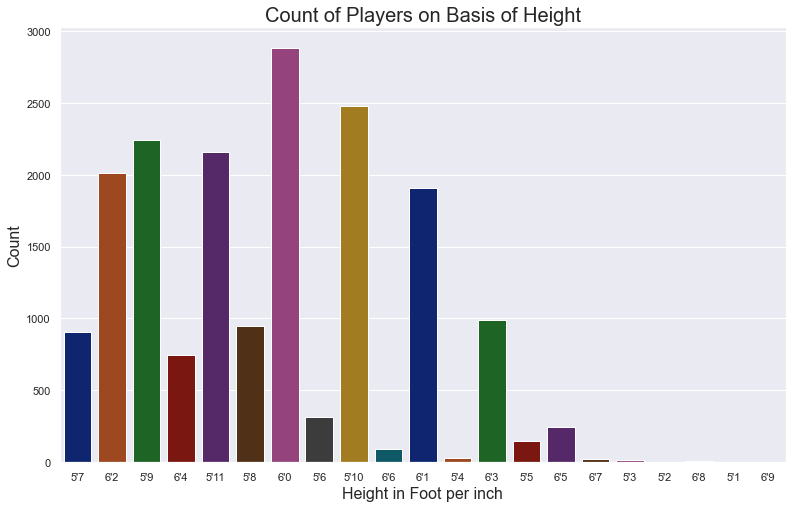

In [130]:
plt.figure(figsize = (13, 8))
ax = sns.countplot(x = 'Height', data = fifa, palette = 'dark')
ax.set_title(label = 'Count of Players on Basis of Height', fontsize = 20)
ax.set_xlabel(xlabel = 'Height in Foot per inch', fontsize = 16)
ax.set_ylabel(ylabel = 'Count', fontsize = 16)
plt.show()

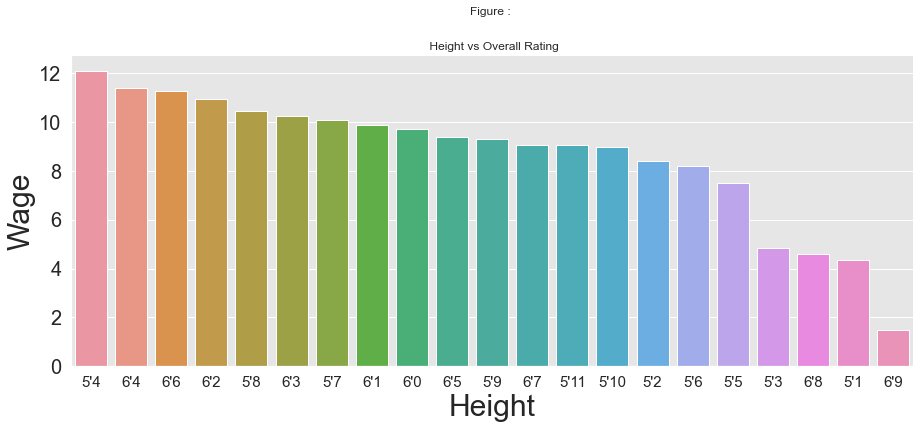

In [80]:
sns.set(rc={"font.style":"normal",
            "axes.facecolor":(0.9, 0.9, 0.9),
            "figure.facecolor":'white',
            'axes.labelsize':30,
            'xtick.labelsize':15,
            'ytick.labelsize':20})
sns.catplot(x="Height", y="Wage",data=avgwageoverall,
            kind="bar",aspect=2.5);
plt.title("Figure : \n\n\n Height vs Overall Rating");

In [81]:
fifa.Club.value_counts()

No Club                241
Burnley                 33
RC Celta                33
TSG 1899 Hoffenheim     33
Frosinone               33
                      ... 
Botafogo                20
Grêmio                  20
Limerick FC             19
Sligo Rovers            19
Derry City              18
Name: Club, Length: 652, dtype: int64

In [82]:
avgwageoverall = fifa.groupby("Club", as_index=False)["Potential"].mean()
avgwageoverall.sort_values(by="Potential",inplace=True,ascending=False)
avgwageoverall.head()

,Club,Potential
326,Juventus,85.520000
212,FC Barcelona,85.303030
471,Real Madrid,84.636364
374,Manchester City,83.909091
214,FC Bayern München,83.655172


In [83]:
top10byoverall = avgwageoverall.iloc[0:10,:]
top10byoverall

,Club,Potential
326,Juventus,85.520000
212,FC Barcelona,85.303030
471,Real Madrid,84.636364
374,Manchester City,83.909091
214,FC Bayern München,83.655172
436,Paris Saint-Germain,83.566667
398,Napoli,83.440000
375,Manchester United,82.666667
134,Chelsea,82.636364
382,Milan,82.555556


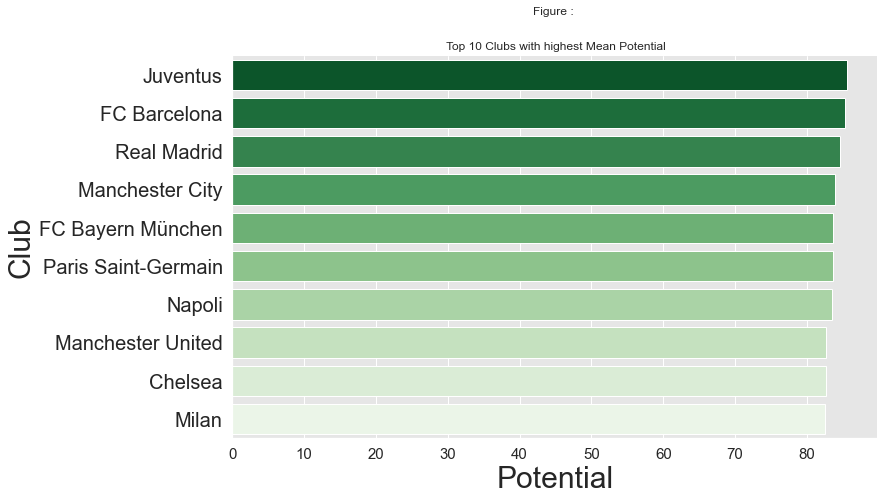

In [84]:
sns.catplot(y="Club",
            x="Potential",data=top10byoverall,
           height=6,kind="bar",aspect=2,palette="Greens_r")
plt.title("Figure : \n\n\n Top 10 Clubs with highest Mean Potential");

In [86]:
top_ten_countries = fifa['Nationality'].value_counts().head(10).index.values
top_ten_countries_data = fifa.loc[fifa['Nationality'].isin(top_ten_countries)]

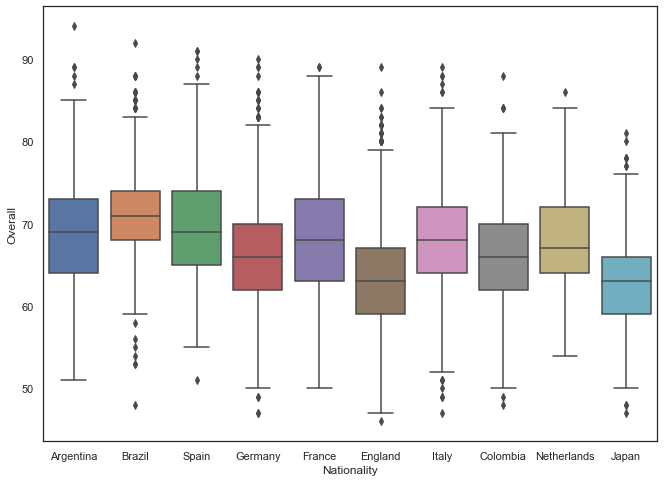

In [87]:
sns.set(style="white")
plt.figure(figsize=(11, 8))
p = sns.boxplot(x = 'Nationality', y = 'Overall', data = top_ten_countries_data)

In [23]:
player = str(fifa.loc[fifa['Potential'].idxmax()][1])
print('Maximum Potential : '+str(fifa.loc[fifa['Potential'].idxmax()][1]))
print('Maximum Overall Perforamnce : '+str(fifa.loc[fifa['Overall'].idxmax()][1]))

Maximum Potential : 19
Maximum Overall Perforamnce : 31


In [24]:
pr_cols=['Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys',
       'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 'BallControl',
       'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 'Balance',
       'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots',
       'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties',
       'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving',
       'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes']
i=0
while i < len(pr_cols):
    print('Best {0} : {1}'.format(pr_cols[i],fifa.loc[fifa[pr_cols[i]].idxmax()][1]))
    i += 1


Best Crossing : 27
Best Finishing : 31
Best HeadingAccuracy : 35
Best ShortPassing : 32
Best Volleys : 31
Best Dribbling : 31
Best Curve : 34
Best FKAccuracy : 31
Best LongPassing : 28
Best BallControl : 31
Best Acceleration : 27
Best SprintSpeed : 19
Best Agility : 26
Best Reactions : 33
Best Balance : 25
Best ShotPower : 33
Best Jumping : 33
Best Stamina : 27
Best Strength : 36
Best LongShots : 31
Best Aggression : 23
Best Interceptions : 27
Best Positioning : 33
Best Vision : 31
Best Penalties : 27
Best Composure : 31
Best Marking : 37
Best StandingTackle : 33
Best SlidingTackle : 32
Best GKDiving : 27
Best GKHandling : 25
Best GKKicking : 32
Best GKPositioning : 40
Best GKReflexes : 27


In [26]:
fifa = dict(type = 'choropleth',
            locations = fifa['Nationality'],
            locationmode = 'country names',
            colorscale = 'Viridis',
            autocolorscale=False,
            z=fifa['Overall'],
            text = fifa["Nationality"],
            colorbar = {'title':'Overall rating'})

In [27]:
layout = dict(geo = {'scope':'north america'},title="Maximum overall rating for countries in North America")

In [28]:
import plotly.graph_objs as gobj
col_map = gobj.Figure(data = [fifa],layout = layout)

In [29]:
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
iplot(col_map)


In [30]:
layout = dict(geo = {'scope':'south america'},title="Maximum overall rating for countries in South America")
col_map = gobj.Figure(data = [fifa],layout = layout)
init_notebook_mode(connected=True)
iplot(col_map)

In [31]:
layout = dict(geo = {'scope':'europe'},title="Maximum overall rating for countries in Europe")
col_map = gobj.Figure(data = [fifa],layout = layout)
init_notebook_mode(connected=True)
iplot(col_map)

In [32]:
layout = dict(geo = {'scope':'asia'},title="Maximum overall rating for countries in Asia")
col_map = gobj.Figure(data = [fifa],layout = layout)
init_notebook_mode(connected=True)
iplot(col_map)


In [33]:
layout = dict(geo = {'scope':'world'},title="Maximum overall rating country-wise across the world")
col_map = gobj.Figure(data = [fifa],layout = layout)
init_notebook_mode(connected=True)
iplot(col_map)

In [25]:
# Visualising - Age vs shot power correlation
fig = px.box(fifa, x="ShotPower", y="Age",title = 'Age vs Shot correlation')
fig.update_traces( marker=dict(color='crimson'))
fig.show()

In [98]:
player_features = ['Crossing', 'Finishing', 'HeadingAccuracy',
       'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy',
       'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed',
       'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping',
       'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions',
       'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking',
       'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
       'GKKicking', 'GKPositioning', 'GKReflexes']
df_postion  = pd.DataFrame()
for position_name, features in fifa.groupby(fifa['Position'])[player_features].mean().iterrows():
    top_features = dict(features.nlargest(5))
    df_postion[position_name] = tuple(top_features)
df_postion.head()

,CAM,CB,CDM,CF,CM,GK,LAM,LB,LCB,LCM,...,RB,RCB,RCM,RDM,RF,RM,RS,RW,RWB,ST
0,Balance,Strength,Stamina,Agility,Balance,GKReflexes,Agility,SprintSpeed,Strength,Stamina,...,SprintSpeed,Strength,Stamina,Stamina,Agility,Acceleration,SprintSpeed,Acceleration,SprintSpeed,SprintSpeed
1,Agility,Jumping,Aggression,Balance,ShortPassing,GKDiving,Balance,Acceleration,Jumping,ShortPassing,...,Stamina,Jumping,ShortPassing,ShortPassing,Acceleration,SprintSpeed,Strength,SprintSpeed,Acceleration,Strength
2,Acceleration,StandingTackle,Strength,Acceleration,Agility,GKPositioning,SprintSpeed,Stamina,StandingTackle,Balance,...,Acceleration,Aggression,Agility,Aggression,Balance,Agility,Acceleration,Agility,Stamina,Acceleration
3,SprintSpeed,Aggression,ShortPassing,SprintSpeed,Stamina,GKHandling,Acceleration,Balance,Aggression,Agility,...,Balance,StandingTackle,Balance,Strength,BallControl,Balance,Agility,Balance,Agility,Jumping
4,BallControl,HeadingAccuracy,Jumping,Dribbling,Acceleration,GKKicking,Dribbling,Agility,HeadingAccuracy,BallControl,...,Jumping,HeadingAccuracy,BallControl,Jumping,SprintSpeed,Dribbling,ShotPower,Dribbling,Balance,Finishing


# Making a Dream Team

In [99]:
#Dream Team
position = []
player = []
club_l = []
for col in df_postion.columns:
    tmp_df = pd.DataFrame()
    l = [df_postion[col].values]
    l = l[0]
    l = list(l)
    l.append('Name')
    tmp_df = pd.DataFrame.copy(fifa[fifa['Position'] == col][l])
    tmp_df['mean'] = np.mean(tmp_df.iloc[: , :-1] , axis = 1)
    name = tmp_df['Name'][tmp_df['mean'] == tmp_df['mean'].max()].values[0]
    club = fifa['Club'][fifa['Name'] == str(name)].values[0]
    position.append(col)
    player.append(name)
    club_l.append(club)
    
gk = ['GK']
forward = ['LS', 'ST', 'RS','LF', 'CF', 'RF']
midfeilder = ['LW','RW', 'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM',
              'RCM', 'RM', 'LDM', 'CDM', 'RDM' ]
defenders = ['LWB','RWB', 'LB', 'LCB', 'CB',]

print('GoalKeeper : ')
for p , n , c in zip(position , player , club_l):
    if p in gk:
        print('{} [Club : {} , Position : {}]'.format(n , c , p))
print('\nFORWARD : ')
for p , n , c in zip(position , player , club_l):
    if p in forward:
        print('{} [Club : {} , Position : {}]'.format(n , c , p))
print('\nMIDFEILDER : ')
for p , n , c in zip(position , player , club_l):
    if p in midfeilder:
        print('{} [Club : {} , Position : {}]'.format(n , c , p))
print('\nDEFENDER : ')
for p , n , c in zip(position , player , club_l):
    if p in defenders:
        print('{} [Club : {} , Position : {}]'.format(n , c , p))


GoalKeeper : 
De Gea [Club : Manchester United , Position : GK]

FORWARD : 
S. Giovinco [Club : Toronto FC , Position : CF]
E. Hazard [Club : Chelsea , Position : LF]
J. Martínez [Club : Atlanta United , Position : LS]
L. Messi [Club : FC Barcelona , Position : RF]
A. Saint-Maximin [Club : OGC Nice , Position : RS]
Cristiano Ronaldo [Club : Juventus , Position : ST]

MIDFEILDER : 
H. Nakagawa [Club : Kashiwa Reysol , Position : CAM]
Casemiro [Club : Real Madrid , Position : CDM]
N. Keïta [Club : Liverpool , Position : CM]
Paulo Daineiro [Club : Ceará Sporting Club , Position : LAM]
David Silva [Club : Manchester City , Position : LCM]
N. Kanté [Club : Chelsea , Position : LDM]
Douglas Costa [Club : Juventus , Position : LM]
Neymar Jr [Club : Paris Saint-Germain , Position : LW]
J. Cuadrado [Club : Juventus , Position : RAM]
L. Modrić [Club : Real Madrid , Position : RCM]
P. Pogba [Club : Manchester United , Position : RDM]
Gelson Martins [Club : Atlético Madrid , Position : RM]
R. Ster

In [97]:
CAM = 'H. Nakagawa'
CB = 'D. Godín'
CDM = 'Casemiro'
CF = 'S. Giovinco'
CM = 'N. Keïta'
GK = 'De Gea'
LAM = 'Paulo Daineiro'
LB = 'Jordi Alba'
LCB = 'G. Chiellini'
LCM = 'David Silva'
LDM = 'N. Kanté' 
LF = 'E. Hazard' 
LM = 'Douglas Costa' 
LS = 'J. Martínez' 
LW = 'Neymar Jr' 
LWB = 'M. Pedersen' 
RAM = 'J. Cuadrado' 
RB = 'Nélson Semedo' 
RCB = 'Sergio Ramos' 
RCM = 'L. Modrić' 
RDM = 'P. Pogba' 
RF = 'L. Messi' 
RM = 'Gelson Martins' 
RS = 'A. Saint-Maximin' 
RW = 'R. Sterling' 
RWB = 'M. Millar' 
ST = 'Cristiano Ronaldo' 

# Formation of a team at suitable positions


In [93]:
def create_football_formation(formation = [] , label_1 = None ,
                              label_2 = None , label_3 = None ,
                              label_4 = None,label_4W = None ,
                              label_5 = None , label_3W = None):
    
    plt.scatter(x = [1] , y = [6] , s = 300 , color = 'blue')
    plt.annotate('De Gea \n(Manchester United)' , (1 - 0.5 , 6 + 0.5))
    plt.plot(np.ones((11 , ))*1.5 , np.arange(1 , 12) , 'w-')
    plt.plot(np.ones((5 , ))*0.5 , np.arange(4 , 9) , 'w-')
    
    n = 0
    for posi in formation:
        if posi ==  1:
            n += 3
            dot = plt.scatter(x = [n]  , y = [6] , s = 400 , color = 'white')
            plt.scatter(x = [n]  , y = [6] , s = 300 , color = 'red')
            for i, txt in enumerate(label_1):
                txt = str(txt+'\n('+fifa['Club'][fifa['Name'] == txt].values[0]+')')
                plt.annotate(txt, ( n-0.5 , 6+0.5))
            
        elif posi == 2:
            n += 3
            y = [5 , 7.5]
            x = [ n , n ]
            plt.scatter(x  , y , s = 400 , color = 'white')
            plt.scatter(x  , y , s = 300 , color = 'red')
            for i, txt in enumerate(label_2):
                txt = str(txt+'\n('+fifa['Club'][fifa['Name'] == txt].values[0]+')') 
                plt.annotate(txt, (x[i] - 0.5, y[i]+0.5))
        elif posi == 3:
            n+=3
            y = [3.333 , 6.666 , 9.999]
            x = [n , n  , n ]
            plt.scatter(x  , y , s = 400 , color = 'white')
            plt.scatter(x  , y , s = 300 , color = 'red')
            for i, txt in enumerate(label_3):
                txt = str(txt+'\n('+fifa['Club'][fifa['Name'] == txt].values[0]+')')
                plt.annotate(txt, (x[i] - 0.5, y[i]+0.5))
            
            if not label_3W == None:
                n+=3
                y = [3.333 , 6.666 , 9.999]
                x = [n , n  , n ]
                plt.scatter(x  , y , s = 400 , color = 'white')
                plt.scatter(x  , y , s = 300 , color = 'red')
                for i, txt in enumerate(label_3W):
                    txt = str(txt+'\n('+fifa['Club'][fifa['Name'] == txt].values[0]+')')
                    plt.annotate(txt, (x[i] - 0.5, y[i]+0.5))
            
        elif posi == 4 and not label_4 == None:
            n+=3
            y = [2.5 , 5 , 7.5 , 10]
            x = [n , n  , n , n ]
            plt.scatter(x  , y , s = 400 , color = 'white')
            plt.scatter(x  , y , s = 300 , color = 'red')
            for i, txt in enumerate(label_4):
                txt = str(txt+'\n('+fifa['Club'][fifa['Name'] == txt].values[0]+')')
                plt.annotate(txt, (x[i] - 0.5, y[i]+0.5))
                
            if not label_4W == None:
                n+=3
                y = [2.5 , 5 , 7.5 , 10]
                x = [n , n  , n , n ]
                plt.scatter(x  , y , s = 400 , color = 'white')
                plt.scatter(x  , y , s = 300 , color = 'red')
                for i, txt in enumerate(label_4W):
                    txt = str(txt+'\n('+fifa['Club'][fifa['Name'] == txt].values[0]+')')
                    plt.annotate(txt, (x[i] - 0.5, y[i]+0.5))
                
                
        elif posi == 5:
            n+=3
            y = [2 , 4 , 6 , 8 , 10]
            x = [n , n , n  , n  , n]
            plt.scatter(x  , y , s = 400 , color = 'white')
            plt.scatter(x  , y , s = 300 , color = 'red')
            for i, txt in enumerate(label_5):
                txt = str(txt+'\n('+fifa['Club'][fifa['Name'] == txt].values[0]+')')
                plt.annotate(txt, (x[i] - 0.5, y[i]+0.5))
            
    plt.plot(np.ones((5 , ))*(n+0.5) , np.arange(4 , 9) , 'w-')
    plt.plot(np.ones((11 , ))*(n/2) , np.arange(1 , 12) , 'w-')
    plt.yticks([])
    plt.xticks([])
    ax = plt.gca()
    ax.set_facecolor('#28fc03')            

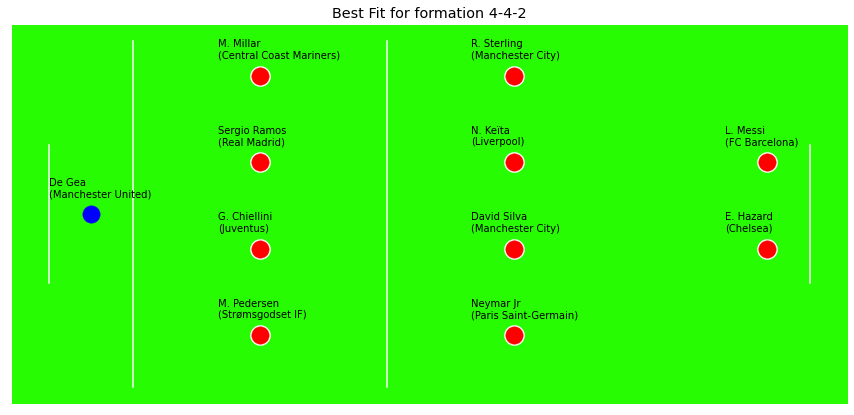

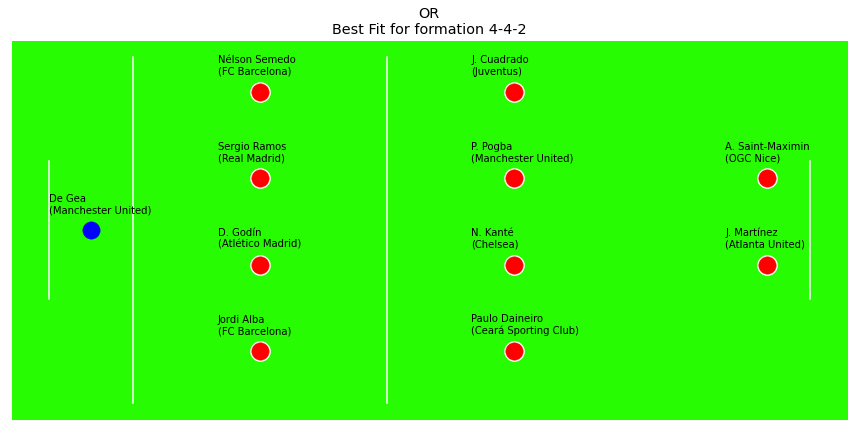

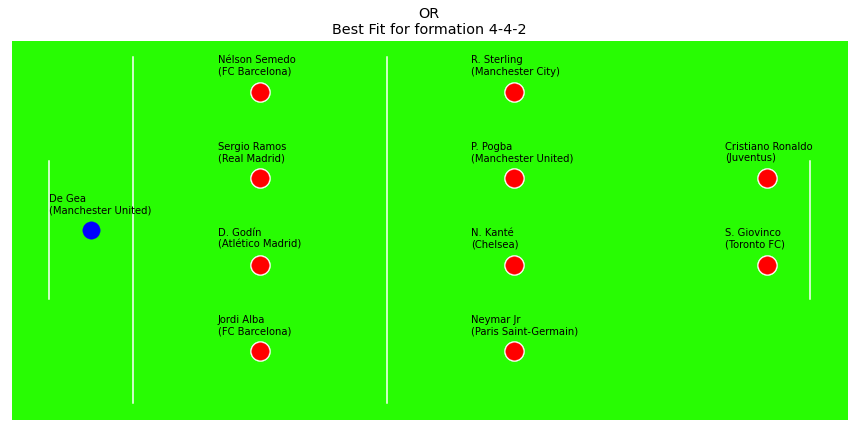

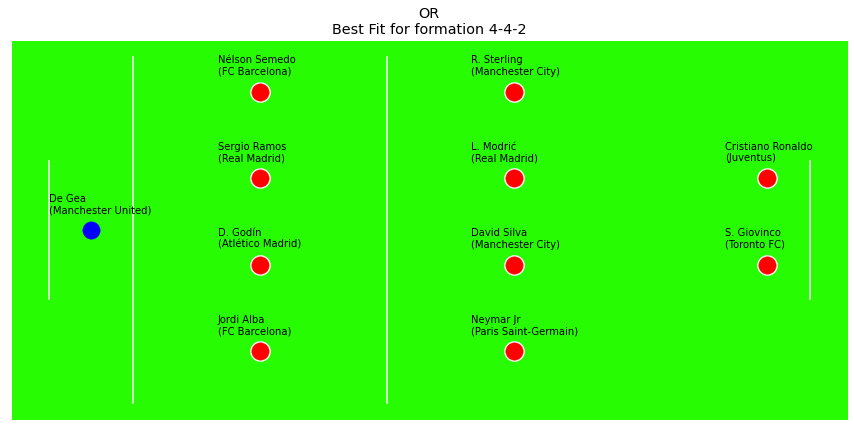

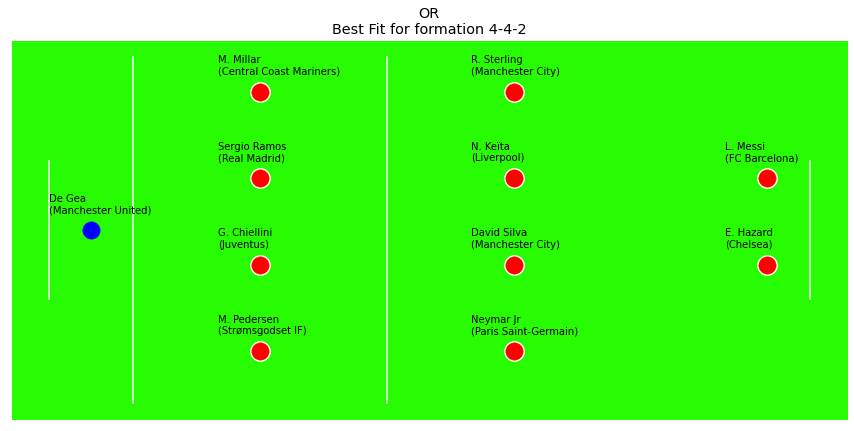

...

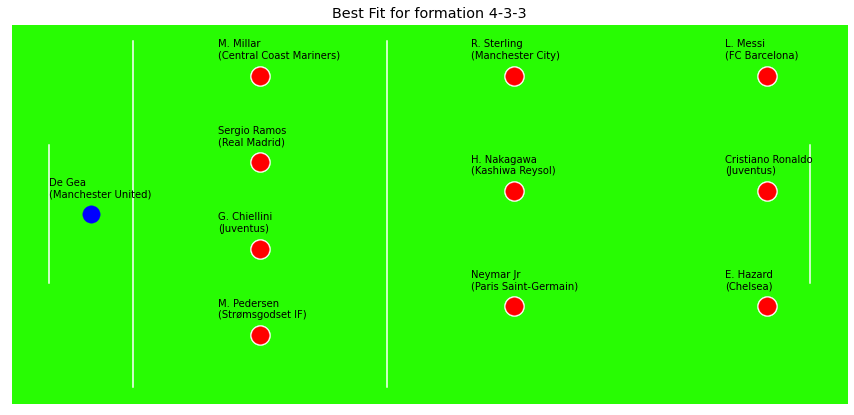

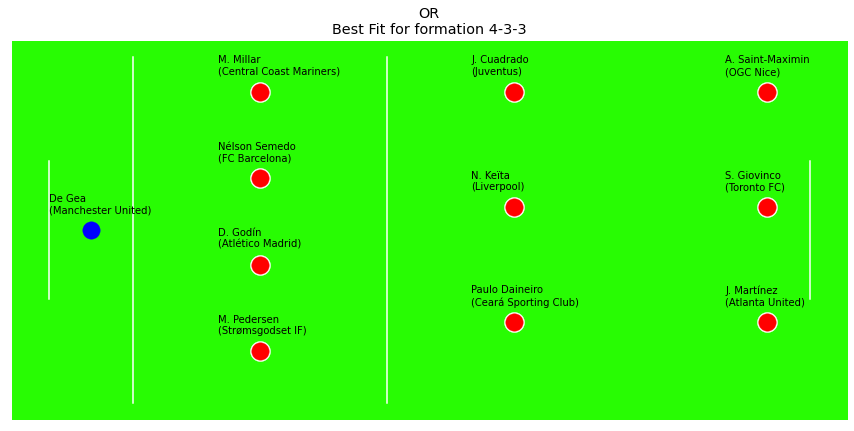

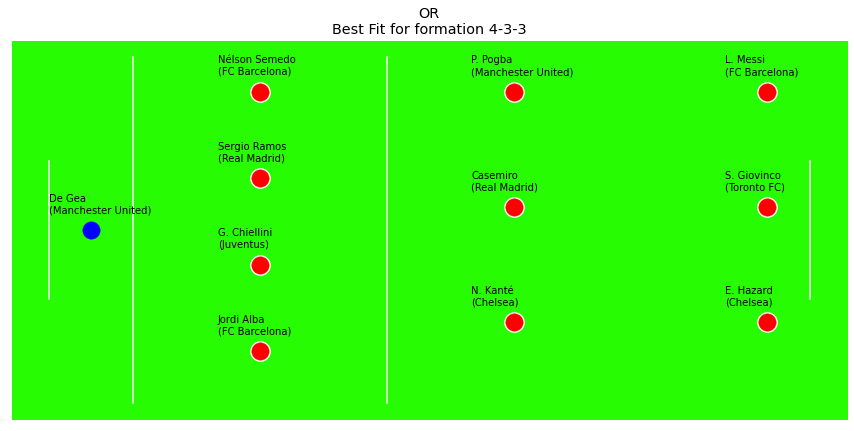

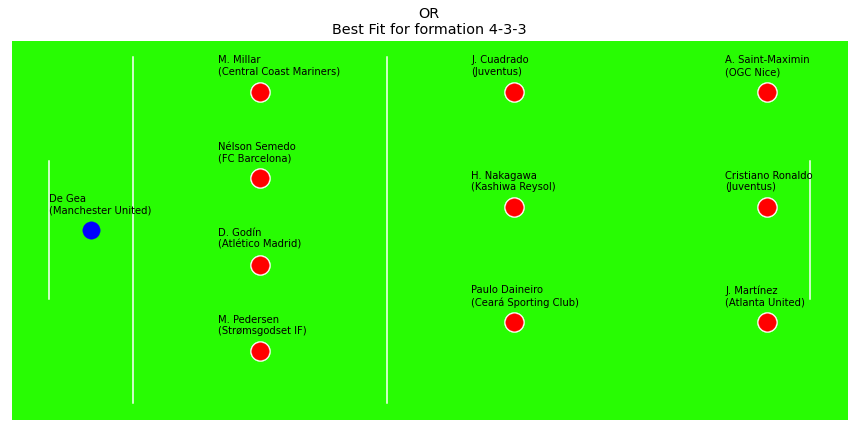

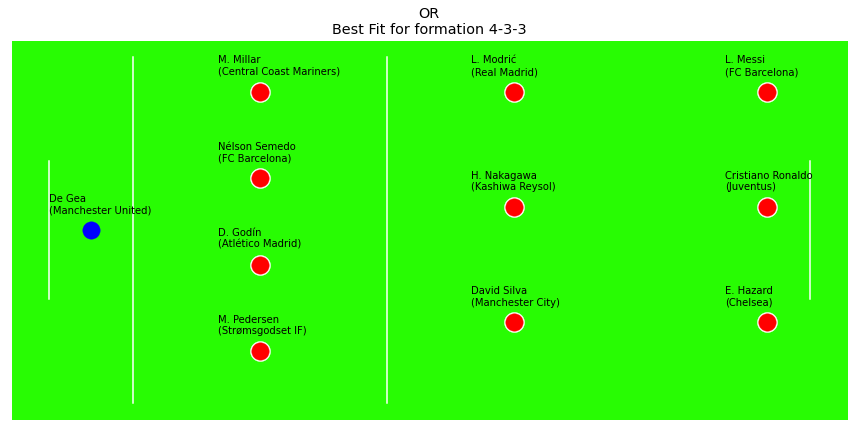

In [100]:
plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 ] , 
                         label_4 = [LWB , LCB , RCB , RWB],
                         label_4W = [LW , LCM , CM , RW],
                         label_2 = [LF , RF],
                         )
plt.title('Best Fit for formation 4-4-2')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 ] , 
                         label_4 = [LB , CB , RCB , RB],
                         label_4W = [LAM , LDM , RDM , RAM],
                         label_2 = [LS , RS],
                         )
plt.title('OR\nBest Fit for formation 4-4-2')
plt.show()


plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 ] , 
                         label_4 = [LB , CB , RCB , RB],
                         label_4W = [LW , LDM , RDM , RW],
                         label_2 = [CF , ST],
                         )
plt.title('OR\nBest Fit for formation 4-4-2')
plt.show()


plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 ] , 
                         label_4 = [LB , CB , RCB , RB],
                         label_4W = [LW , LCM , RCM , RW],
                         label_2 = [CF , ST],
                         )
plt.title('OR\nBest Fit for formation 4-4-2')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 ] , 
                         label_4 = [LWB , LCB , RCB , RWB],
                         label_4W = [LW , LCM , CM , RW],
                         label_2 = [LF , RF],
                         )
plt.title('OR\nBest Fit for formation 4-4-2')
plt.show()


plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 , 3 , 1] , 
                         label_4 = [LWB , LCB , RCB , RWB],
                         label_2 = [LCM , RCM],
                         label_3 = [LF , CAM , RF],
                         label_1 = [ST])
plt.title('Best Fit for formation 4-2-3-1')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 , 3 , 1] , 
                         label_4 = [LWB , LB , RB , RWB],
                         label_2 = [LAM , RAM],
                         label_3 = [LW , CF , RW],
                         label_1 = [ST])
plt.title('OR\nBest Fit for formation 4-2-3-1')
plt.show()

plt.figure(1 , figsize = (15 , 7))
create_football_formation(formation = [ 4 , 2 , 3 , 1] , 
                         label_4 = [LWB , CB , RCB , RWB],
                         label_2 = [CM , CAM],
                         label_3 = [LF , CM , RF],
                         label_1 = [ST])
plt.title('OR\nBest Fit for formation 4-2-3-1')

plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 , 3 , 1] , 
                         label_4 = [LWB , LCB , RCB , RWB],
                         label_2 = [LCM , RCM],
                         label_3 = [LDM , CAM , RDM],
                         label_1 = [ST])
plt.title('OR\nBest Fit for formation 4-2-3-1')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 5, 4 , 1 ] , 
                         label_5 = [LWB , LCB , CB , RCB , RWB],
                         label_4 = [LW, LDM , RDM , RW],
                         label_1 = [ST])
plt.title('Best Fit for formation 5-4-1')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 3 ] , 
                         label_4 = [LWB , LCB , RCB , RWB],
                         label_3 = [LW, CAM , RW],
                         label_3W = [LF , ST , RF])
plt.title('Best Fit for formation 4-3-3')
plt.show()


plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 3 ] , 
                         label_4 = [LWB , CB , RB , RWB],
                         label_3 = [LAM, CM , RAM],
                         label_3W = [LS , CF , RS])
plt.title('OR\nBest Fit for formation 4-3-3')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 3 ] , 
                         label_4 = [LB , LCB , RCB , RB],
                         label_3 = [LDM, CDM , RDM],
                         label_3W = [LF , CF , RF])
plt.title('OR\nBest Fit for formation 4-3-3')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 3] , 
                         label_4 = [LWB , CB , RB , RWB],
                         label_3 = [LAM, CAM , RAM],
                         label_3W = [LS , ST , RS])
plt.title('OR\nBest Fit for formation 4-3-3')
plt.show()


plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 3] , 
                         label_4 = [LWB , CB , RB , RWB],
                         label_3 = [LCM, CAM , RCM],
                         label_3W = [LF , ST , RF])
plt.title('OR\nBest Fit for formation 4-3-3')
plt.show()


count    18207.000000
mean       265.026929
std        289.564928
min          0.000000
25%          4.400000
50%        160.000000
75%        475.000000
max        975.000000
Name: Value, dtype: float64
Skewness: 0.828364
Kurtosis: -0.565910


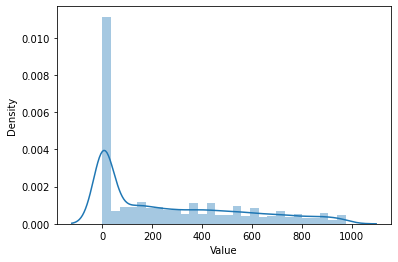

In [15]:

print(fifa.Value.describe())
sns.distplot(fifa.Value);
#skewness and kurtosis
print("Skewness: %f" % fifa['Value'].skew())
print("Kurtosis: %f" % fifa['Value'].kurt())

<AxesSubplot:title={'center':'Correlation heatmap of player skills'}>

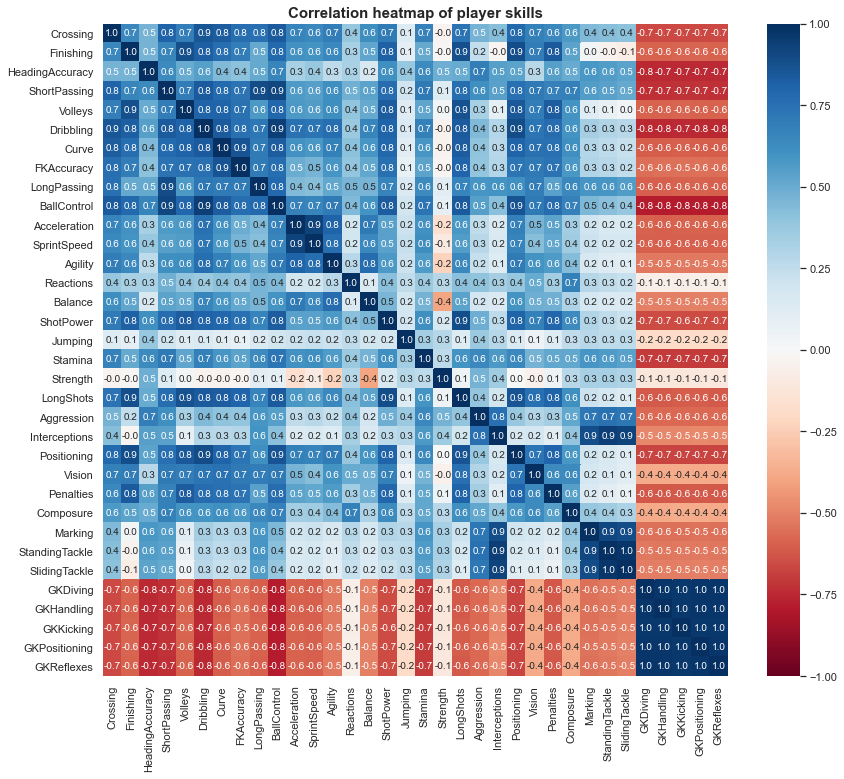

In [130]:
corr_matrix=fifa.iloc[:, 49:83].corr()
# plot it
plt.figure(figsize= (14,12))
plt.title('Correlation heatmap of player skills', fontsize = 15, weight = 'bold')
sns.heatmap(corr_matrix, cmap='RdBu', vmin=-1, vmax=1, annot=True, fmt = '.1f', 
            annot_kws={"size": 10})

In [80]:
 #Calculate correlation between each pair of variable
corr_matrix=fifa.iloc[:, 49:78][fifa['SimplifiedPosition']=='Attacker'].corr()
df_skills =fifa.iloc[:, 49:83].groupby(fifa['Position']).apply(np.mean).T

In [143]:
fifa = fifa[fifa['Position'].notnull()]

In [32]:
pos_dict = {
    'Goalkeeper': ['GK'],
    'Defender': ['LWB', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB'],
    'Midfielder': ['LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 
                   'RCM', 'RM', 'LDM', 'CDM', 'RDM'],
    'Attacker': ['LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW']
}

fifa['Position'].head()

0     RF
1     ST
2     LW
3     GK
4    RCM
Name: Position, dtype: object

In [33]:
def simplify_position(position):
    for key in pos_dict:
        if position in pos_dict[key]:
            return key
        else:
            continue
fifa['SimplifiedPosition']= fifa['Position'].apply(simplify_position)

In [34]:
fifa[['Position','SimplifiedPosition']].iloc[:10]

,Position,SimplifiedPosition
0,RF,Attacker
1,ST,Attacker
2,LW,Attacker
3,GK,Goalkeeper
4,RCM,Midfielder
5,LF,Attacker
6,RCM,Midfielder
7,RS,Attacker
8,RCB,Defender
9,GK,Goalkeeper


In [35]:
fifa['SimplifiedPosition'].value_counts()

Midfielder    6838
Defender      5866
Attacker      3418
Goalkeeper    2025
Name: SimplifiedPosition, dtype: int64

In [104]:
#Handle datetime columns
fifa[['Name','Joined','Contract Valid Until']].head()

,Name,Joined,Contract Valid Until
0,L. Messi,"Jul 1, 2004",2021
1,Cristiano Ronaldo,"Jul 10, 2018",2022
2,Neymar Jr,"Aug 3, 2017",2022
3,De Gea,"Jul 1, 2011",2020
4,K. De Bruyne,"Aug 30, 2015",2023


In [109]:
fifa[fifa.duplicated()]

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,Preferred Foot,...,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause,SimplifiedPosition


In [110]:
topwage= fifa[['Name','Value', 'Wage']].nlargest(10,'Wage', keep = 'first')
#df[['Name','Value', 'Wage']].sort_values(by = ['Wage'], ascending = False)
topwage = topwage.set_index('Name')
topwage


,Value,Wage
Name,,
L. Messi,110.5,565.0
L. Suárez,80.0,455.0
L. Modrić,67.0,420.0
Cristiano Ronaldo,77.0,405.0
Sergio Ramos,51.0,380.0
K. De Bruyne,102.0,355.0
T. Kroos,76.5,355.0
G. Bale,60.0,355.0
E. Hazard,93.0,340.0


Text(0, 0.5, 'Wage')

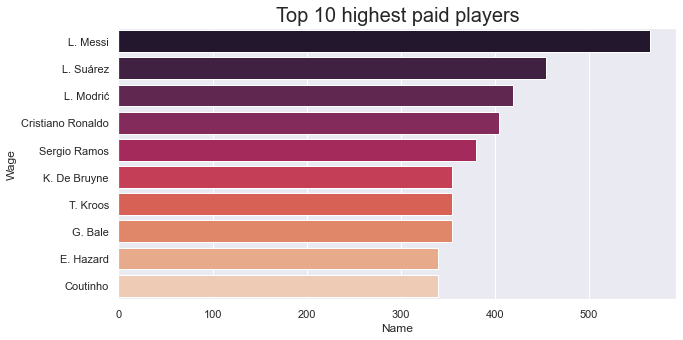

In [111]:
plt.figure(figsize=(10,5))
sns.set()
sns.barplot(x = topwage['Wage'], y =topwage.index,  palette = 'rocket')
plt.title('Top 10 highest paid players', fontsize = 20)
plt.xlabel('Name', fontsize =12)
plt.ylabel('Wage', fontsize =12)

In [112]:

fifa['Growth Potential'] = fifa['Potential'] - fifa['Overall']

# Top 10 players with highest growth potential where potential > 90
top_potential = fifa[['Name', 'Age', 'Wage', 'SimplifiedPosition', 
    'Club','Growth Potential', 'Potential', 
    'Overall']].loc[fifa['Potential']>90].nlargest(10, 'Growth Potential', keep = 'first')
top_potential

,Name,Age,Wage,SimplifiedPosition,Club,Growth Potential,Potential,Overall
1143,Vinícius Júnior,17,66.0,Attacker,Real Madrid,15,92,77
229,G. Donnarumma,19,23.0,Goalkeeper,Milan,11,93,82
155,O. Dembélé,21,155.0,Attacker,FC Barcelona,9,92,83
156,Gabriel Jesus,21,130.0,Attacker,Manchester City,9,92,83
226,M. de Ligt,18,11.0,Defender,Ajax,9,91,82
177,Kepa,23,84.0,Goalkeeper,Chelsea,8,91,83
25,K. Mbappé,19,100.0,Midfielder,Paris Saint-Germain,7,95,88
77,M. Škriniar,23,82.0,Defender,Inter,7,92,85
79,Marco Asensio,22,215.0,Attacker,Real Madrid,7,92,85
55,L. Sané,22,195.0,Attacker,Manchester City,6,92,86


Text(0.5, 1.0, 'Top 10 Players with highest Growth Potential (>90 Potential)')

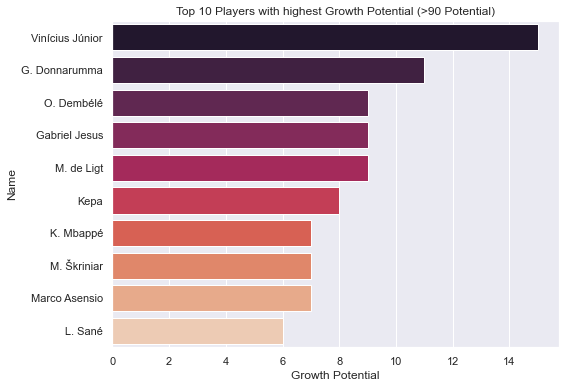

In [113]:

plt.figure(figsize = (8,6))
sns.barplot(x = 'Growth Potential', y = 'Name', data = top_potential, palette = 'rocket')
plt.title('Top 10 Players with highest Growth Potential (>90 Potential)')


In [36]:
corr_matrix=fifa.iloc[:, 49:78][fifa['SimplifiedPosition']=='Attacker'].corr()
df_skills =fifa.iloc[:, 49:83].groupby(fifa['Position']).apply(np.mean).T

In [114]:
df_skills =fifa.iloc[:, 49:83].groupby(fifa['SimplifiedPosition']).apply(np.mean).T

df_skills90 = fifa.iloc[:, 49:83].groupby(fifa['SimplifiedPosition']).quantile(0.9).T


# cluster map for  overall positions

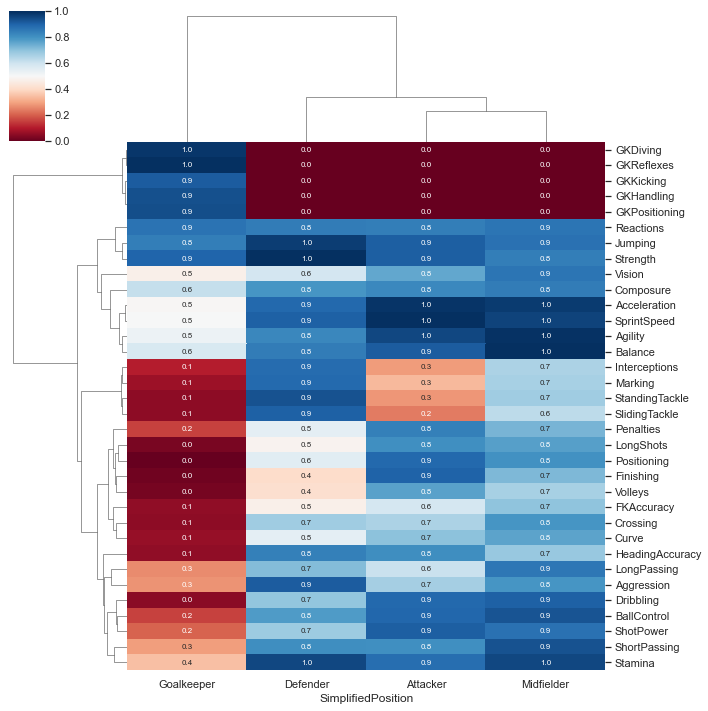

In [115]:
sns.clustermap(df_skills, cmap='RdBu', standard_scale= 1,
               annot=True, fmt = '.1f', 
               annot_kws={"size": 8})

# Using Linear regression model

In [38]:
df_noGK = fifa[fifa['SimplifiedPosition'] !='Goalkeeper']

variables = df_noGK.iloc[:, 49:78].columns
x = df_noGK[variables].values
x

array([[84., 95., 70., ..., 33., 28., 26.],
       [84., 94., 89., ..., 28., 31., 23.],
       [79., 87., 62., ..., 27., 24., 33.],
       ...,
       [25., 40., 46., ..., 32., 13., 11.],
       [44., 50., 39., ..., 20., 25., 27.],
       [41., 34., 46., ..., 40., 43., 50.]])

In [39]:
target = df_noGK['Overall']
y = target.values
y

array([94, 94, 92, ..., 47, 47, 46], dtype=int64)

In [40]:
from sklearn.model_selection import train_test_split

# 80% train 20% test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= 0.2)

print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(12907, 29) (12907,)
(3227, 29) (3227,)


In [41]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x_train, y_train)

LinearRegression()

In [118]:
from sklearn.metrics import mean_absolute_error, r2_score

In [119]:
y_pred = lr.predict(x_test)
print (y_pred)
print ('MAE: {}'.format(mean_absolute_error(y_test,y_pred)))
print ('R2 score: {}'.format(r2_score(y_test, y_pred))) #Variance

[72.74152192 71.98695148 65.26058048 ... 63.79457675 67.03905365
 70.137737  ]
MAE: 1.999343878891366
R2 score: 0.8647978445891862


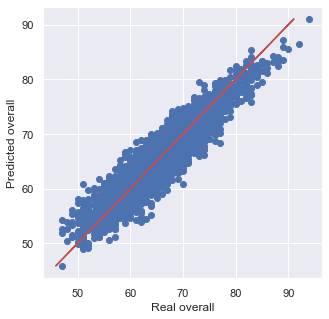

In [120]:
plt.figure(figsize = (5,5))
plt.xlabel ('Real overall')
plt.ylabel('Predicted overall')
plt.scatter(y_test,y_pred)
plt.plot(y_pred,y_pred, color = 'r')

# The closer the blue dots are to the red line, the better the prediction is.
# Overall the blue dots are hugging the red line, which means the regression model is a suitable model 
# to predict player's overall rating especially given that the MAE and R2 score are small.

In [121]:
results = pd.DataFrame({
    'Real overall': y_test,
    'Predicted overall': y_pred,
    'Difference': np.abs(y_test - y_pred)
})
results.head()

,Real overall,Predicted overall,Difference
0,74,72.741522,1.258478
1,74,71.986951,2.013049
2,66,65.260580,0.739420
3,71,72.937070,1.937070
4,73,71.258968,1.741032


In [122]:
coef = pd.DataFrame(data = lr.coef_, index = variables, columns = ['Coef'])
coef.nlargest(10, 'Coef')

,Coef
Reactions,0.273197
BallControl,0.160605
Composure,0.143336
ShortPassing,0.106811
HeadingAccuracy,0.086824
Acceleration,0.045677
Strength,0.043253
Marking,0.035423
Finishing,0.032482
SprintSpeed,0.027579


In [6]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.exceptions import DataConversionWarning
fifa = pd.read_csv("D:\\data.csv")
fifa.head()

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


# Recommendation system for similar players

In [8]:
attributes = fifa.iloc[:, 54:83]
attributes['Skill Moves'] = fifa['Skill Moves']
workrate = fifa['Work Rate'].str.get_dummies(sep='/ ')
attributes = pd.concat([attributes, workrate], axis=1)
df = attributes
attributes = attributes.dropna()
df['Name'] = fifa['Name']
df = df.dropna()
print(attributes.columns)

Index(['Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys',
       'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 'BallControl',
       'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 'Balance',
       'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots',
       'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties',
       'Composure', 'Marking', 'StandingTackle', 'SlidingTackle',
       'Skill Moves', 'High', 'Low', 'Medium'],
      dtype='object')


In [9]:
scaled = StandardScaler()
X = scaled.fit_transform(attributes)

In [10]:
recommendations = NearestNeighbors(n_neighbors=6, algorithm='ball_tree').fit(X)

In [11]:
player_indices = recommendations.kneighbors(X)[1]

def get_index(x):
    return fifa[fifa['Name']==x].index.tolist()[0]

def recommend_me(player):
    print('Here are 5 players similar to', player, ':' '\n')
    index = get_index(player)
    for i in player_indices[index][1:]:
            print(fifa.iloc[i]['Name'], '\n')

recommend_me("Cristiano Ronaldo")

Here are 5 players similar to Cristiano Ronaldo :

M. Depay 

Q. Promes 

A. Griezmann 

E. Lavezzi 

A. Sánchez 



In [124]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler, PolynomialFeatures


In [127]:
from sklearn.metrics import mean_squared_error, explained_variance_score, r2_score

def plot_prediction_analysis(y, y_pred, figsize=(10,4), title=''):
    fig, axs = plt.subplots(1, 2, figsize=figsize)
    axs[0].scatter(y, y_pred)
    mn = min(np.min(y), np.min(y_pred))
    mx = max(np.max(y), np.max(y_pred))
    axs[0].plot([mn, mx], [mn, mx], c='red')
    axs[0].set_xlabel('$y$')
    axs[0].set_ylabel('$\hat{y}$')
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    evs = explained_variance_score(y, y_pred)
    r2 = r2_score(y, y_pred)
    axs[0].set_title('rmse = {:.2f}, evs = {:.2f}, r2 = {:,.2f}'.format(rmse, evs, r2))
    
    axs[1].hist(y-y_pred, bins=50)
    avg = np.mean(y-y_pred)
    std = np.std(y-y_pred)
    axs[1].set_xlabel('$y - \hat{y}$')
    axs[1].set_title('Histrogram prediction error, $\mu$ = {:.2f}, $\sigma$ = {:.2f}'.format(avg, std))
    
    if title!='':
        fig.suptitle(title)
        

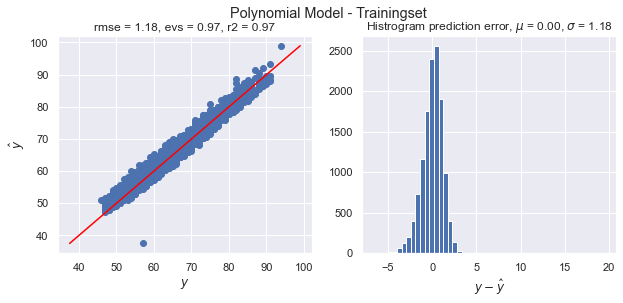

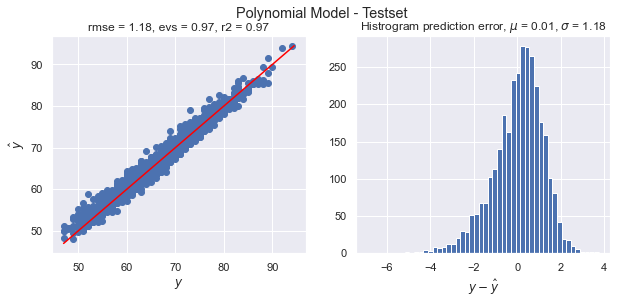

In [128]:
model = Pipeline((
        ("standard_scaler", StandardScaler()),
        ("poly", PolynomialFeatures(degree=2)),
        ("lin_reg", Lasso(alpha=0.01))
    ))

model.fit(x_train, y_train)

y_train_pred = model.predict(x_train)

plot_prediction_analysis(y_train, y_train_pred, title='Polynomial Model - Trainingset')

y_test_pred = model.predict(x_test)
plot_prediction_analysis(y_test, y_test_pred, title='Polynomial Model - Testset')